In [212]:
"""
## New York City Taxi Trip Duration:  

>The competition dataset is based on the 2016 NYC Yellow Cab trip record data  
made available in Big Query on Google Cloud Platform. The data was originally  
published by the NYC Taxi and Limousine Commission (TLC). The data was sampled  
and cleaned for the purposes of this playground competition. Based on individual  
trip attributes, participants should predict the duration of each trip in the test set. 


## File descriptions:  

>train.csv - the training set (contains 1458644 trip records)  
test.csv - the testing set (contains 625134 trip records)  
sample_submission.csv - a sample submission file in the correct format  

## Data fields:  
>id - a unique identifier for each trip  
vendor_id - a code indicating the provider associated with the trip record  
pickup_datetime - date and time when the meter was engaged  
dropoff_datetime - date and time when the meter was disengaged  
passenger_count - the number of passengers in the vehicle (driver entered value)  
pickup_longitude - the longitude where the meter was engaged  
pickup_latitude - the latitude where the meter was engaged  
dropoff_longitude - the longitude where the meter was disengaged  
dropoff_latitude - the latitude where the meter was disengaged  
store_and_fwd_flag - This flag indicates whether the trip record was held in vehicle memory   before sending to the vendor because the vehicle did not have a connection to the server -   Y=store and forward; N=not a store and forward trip  
trip_duration - duration of the trip in seconds  

## Disclaimer:  
>The code is scripted by Xinzhou Yan. Due to the limitation of Time,  
There must be some mistakes and misunderstanding. So thank you for   
your reading and patience. _____ Xinzhou Yan 3.25.18
"""

'\n## New York City Taxi Trip Duration:  \n\n>The competition dataset is based on the 2016 NYC Yellow Cab trip record data  \nmade available in Big Query on Google Cloud Platform. The data was originally  \npublished by the NYC Taxi and Limousine Commission (TLC). The data was sampled  \nand cleaned for the purposes of this playground competition. Based on individual  \ntrip attributes, participants should predict the duration of each trip in the test set. \n\n\n## File descriptions:  \n\n>train.csv - the training set (contains 1458644 trip records)  \ntest.csv - the testing set (contains 625134 trip records)  \nsample_submission.csv - a sample submission file in the correct format  \n\n## Data fields:  \n>id - a unique identifier for each trip  \nvendor_id - a code indicating the provider associated with the trip record  \npickup_datetime - date and time when the meter was engaged  \ndropoff_datetime - date and time when the meter was disengaged  \npassenger_count - the number of pass

In [1]:
import numpy as np
import pandas as pd
from sklearn import preprocessing
from statsmodels.stats.outliers_influence import variance_inflation_factor
import missingno as msno
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import math
import seaborn as sns
from scipy.stats import norm
import scipy.stats as st
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import classification_report
import pickle
from random import *
from scipy.optimize import fmin_l_bfgs_b
from scipy.sparse import vstack, hstack, csr_matrix, issparse, csc_matrix, coo_matrix
from sklearn.preprocessing import normalize, scale
from sklearn.linear_model import Ridge , LogisticRegression, ridge_regression, RANSACRegressor
from sklearn.metrics import accuracy_score, roc_auc_score, mean_squared_error
from scipy.special import expit
from multiprocessing import Pool
from multiprocessing.dummy import Pool as dPool
from sklearn.feature_selection import chi2
import itertools, random
import warnings
from arcgis.gis import GIS
from scipy import special
import scipy.stats as stats
from scipy.special import xlogy
from datetime import date
import datetime

## Data Analysis 

In [2]:
path='/Users/yanxinzhou/course/review/2016_NYC_Yellow_Cab_trip_record_data/data/'

In [136]:
#train=pd.read_csv(path+'train.csv')
test=pd.read_csv(path+'test.csv')

In [3]:
"""
id - a unique identifier for each trip
vendor_id - a code indicating the provider associated with the trip record
pickup_datetime - date and time when the meter was engaged
dropoff_datetime - date and time when the meter was disengaged
passenger_count - the number of passengers in the vehicle (driver entered value)
pickup_longitude - the longitude where the meter was engaged
pickup_latitude - the latitude where the meter was engaged
dropoff_longitude - the longitude where the meter was disengaged
dropoff_latitude - the latitude where the meter was disengaged
store_and_fwd_flag - This flag indicates whether the trip record was held in vehicle memory before sending to the vendor because the vehicle did not have a connection to the server - Y=store and forward; N=not a store and forward trip
trip_duration - duration of the trip in seconds
"""

'\nid - a unique identifier for each trip\nvendor_id - a code indicating the provider associated with the trip record\npickup_datetime - date and time when the meter was engaged\ndropoff_datetime - date and time when the meter was disengaged\npassenger_count - the number of passengers in the vehicle (driver entered value)\npickup_longitude - the longitude where the meter was engaged\npickup_latitude - the latitude where the meter was engaged\ndropoff_longitude - the longitude where the meter was disengaged\ndropoff_latitude - the latitude where the meter was disengaged\nstore_and_fwd_flag - This flag indicates whether the trip record was held in vehicle memory before sending to the vendor because the vehicle did not have a connection to the server - Y=store and forward; N=not a store and forward trip\ntrip_duration - duration of the trip in seconds\n'

In [4]:
train.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435


In [5]:
train.describe()

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration
count,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06
mean,1.534950e+00,1.664530e+00,-7.397349e+01,4.075092e+01,-7.397342e+01,4.075180e+01,9.594923e+02
std,4.987772e-01,1.314242e+00,7.090186e-02,3.288119e-02,7.064327e-02,3.589056e-02,5.237432e+03
min,1.000000e+00,0.000000e+00,-1.219333e+02,3.435970e+01,-1.219333e+02,3.218114e+01,1.000000e+00
25%,1.000000e+00,1.000000e+00,-7.399187e+01,4.073735e+01,-7.399133e+01,4.073588e+01,3.970000e+02
50%,2.000000e+00,1.000000e+00,-7.398174e+01,4.075410e+01,-7.397975e+01,4.075452e+01,6.620000e+02
75%,2.000000e+00,2.000000e+00,-7.396733e+01,4.076836e+01,-7.396301e+01,4.076981e+01,1.075000e+03
max,2.000000e+00,9.000000e+00,-6.133553e+01,5.188108e+01,-6.133553e+01,4.392103e+01,3.526282e+06


### missing data

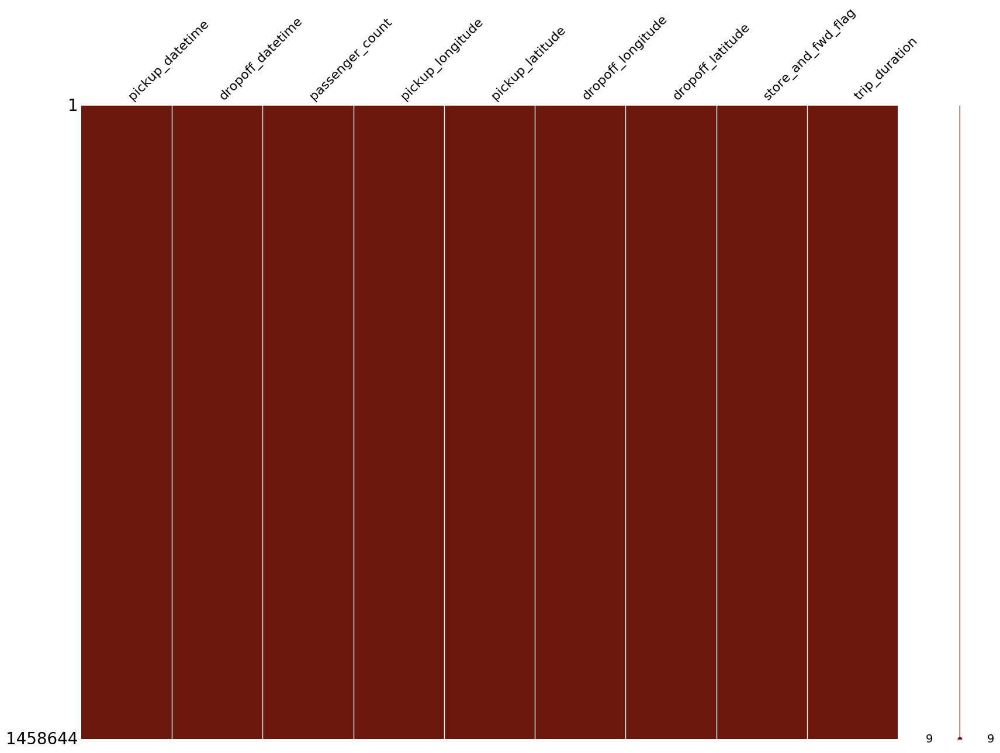

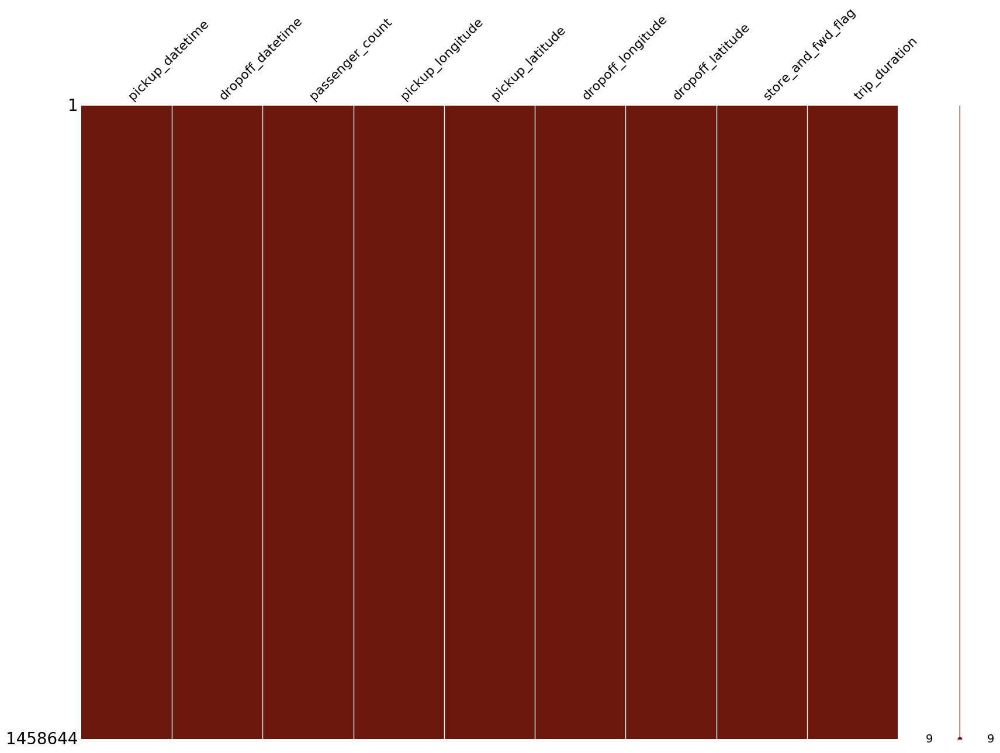

In [30]:
msno.matrix(df=train.iloc[:,2:], figsize=(20, 14), color=(0.42, 0.1, 0.05))
plt.show()

In [7]:
train.isnull().sum()
test.isnull().sum()

id                    0
vendor_id             0
pickup_datetime       0
passenger_count       0
pickup_longitude      0
pickup_latitude       0
dropoff_longitude     0
dropoff_latitude      0
store_and_fwd_flag    0
dtype: int64

In [8]:
## Does feature store_and_fwd_flag make difference?
train['store_and_fwd_flag'].value_counts()

N    1450599
Y       8045
Name: store_and_fwd_flag, dtype: int64

In [306]:
train['location']='New York'

In [9]:
num_feature=['pickup_datetime','dropoff_datetime','passenger_count','pickup_longitude',
     'pickup_latitude','dropoff_longitude','dropoff_latitude','trip_duration']

In [267]:
sh=[x for x in range(train.shape[0])]
np.random.shuffle(sh)
sample=train.iloc[sh[:10000]]

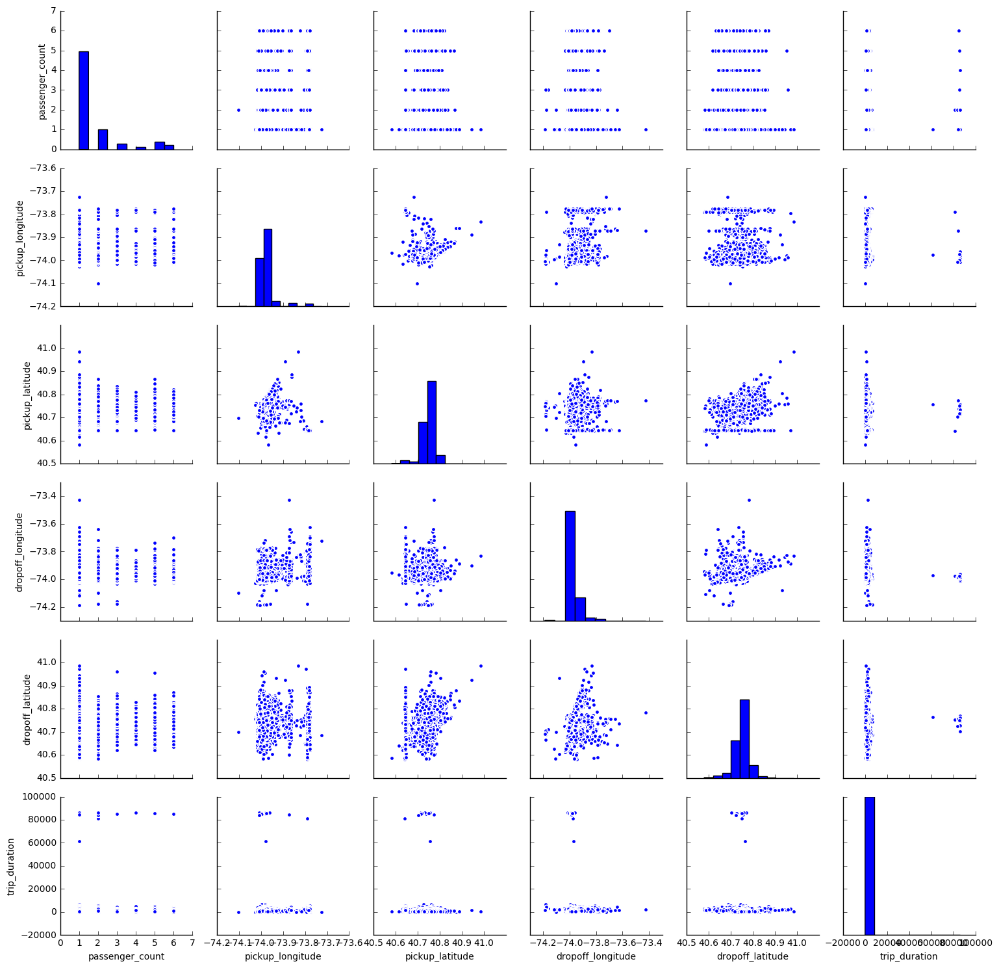

In [31]:
sns.pairplot(sample[num_feature])
plt.show()

In [12]:
"""
1. some trip are unreasonally long duration, which could be outlier.
2. trip time is sensitive to the geo-distribution, so it should apply k-mean
    to categorize the geo-information [begin, end], which map it to 0_2
3. make distance feature
4. make weather feature
5. Is it possible to guess gender/race of driver and map it to test data via vendor_id?
    vendor_id implies the identity of driver, so impossible.
"""

'\n1. some trip are unreasonally long duration, which could be outlier.\n2. trip time is sensitive to the geo-distribution, so it should apply k-mean\n    to categorize the geo-information [begin, end], which map it to 0_2\n3. make distance feature\n4. make weather feature\n5. Is it possible to guess gender/race of driver and map it to test data via vendor_id?\n    vendor_id implies the identity of driver, so impossible.\n'

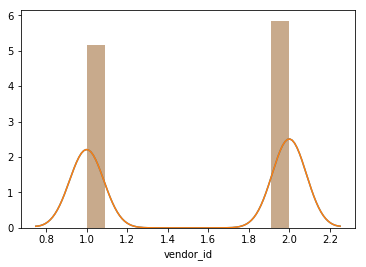

In [6]:
sns.distplot(sample['vendor_id'])
plt.show()

#### ArcGis Playground

In [6]:
from copy import deepcopy
from datetime import datetime
from IPython.display import HTML
import json
import pandas as pd
from arcgis.gis import GIS
import arcgis.network as network
import arcgis.geocoding as geocoding

In [17]:
f=open('/Users/yanxinzhou/course/review/2016_NYC_Yellow_Cab_trip_record_data/login.txt','r')
buff=f.readlines()
my_gis = GIS('https://www.arcgis.com', buff[0].strip(),  buff[1].strip())

In [21]:
route_service_url = my_gis.properties.helperServices.route.url
route_service = network.RouteLayer(route_service_url, gis=my_gis)

In [25]:
route_layer = network.RouteLayer(route_service_url, gis=my_gis)
result = route_layer.solve(stops='''18.068598,59.329268; 18.068598,59.429268''',
                           return_directions=False,return_routes=True,
                           output_lines='esriNAOutputLineNone',
                           return_barriers=False, return_polygon_barriers=False, 
                           return_polyline_barriers=False,start_time=start_time,
                           start_time_is_utc=True
)

travel_time = result['routes']['features'][0]['attributes']['Total_TravelTime']
print("Total travel time is {0:.2f} min".format(travel_time))

NameError: name 'start_time' is not defined

In [8]:
my_gis = GIS()
my_gis.map()

### Domain of data

In [68]:
train['pickup_datetime'].describe()

count                 1458643
unique                1380221
top       2016-06-10 23:17:17
freq                        5
first     2016-01-01 00:00:17
last      2016-06-30 23:59:39
Name: pickup_datetime, dtype: object

In [69]:
test['pickup_datetime'].describe()

count                  625134
unique                 610581
top       2016-02-04 19:54:06
freq                        4
first     2016-01-01 00:00:22
last      2016-06-30 23:59:58
Name: pickup_datetime, dtype: object

In [ ]:
"""
New York belongs to Humid subtropical climate area.
So New York has a snowy winter and rainy spring.
It is necessary to take it into account.
"""

In [83]:
train.loc[:, 'pickup_month'] = train['pickup_datetime'].dt.month

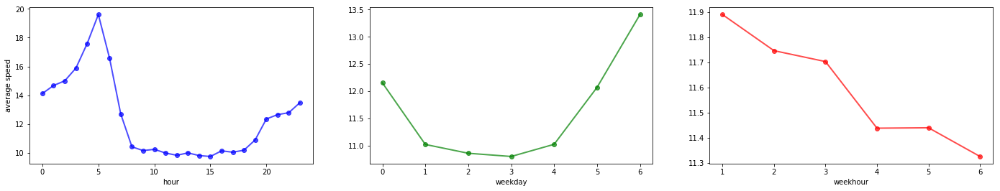

In [100]:
from matplotlib import gridspec

fig, ax = plt.subplots(figsize=(24,4),ncols=3, sharey=True)

gs = gridspec.GridSpec(1, 3, width_ratios=[1,1, 1]) 
ax[0] = plt.subplot(gs[0])
ax[1] = plt.subplot(gs[1])
ax[2] = plt.subplot(gs[2])

ax[0].plot(train.groupby('pickup_hour').mean()['speed'], 'bo-', lw=2, alpha=0.7)
ax[1].plot(train.groupby('pickup_weekday').mean()['speed'], 'go-', lw=2, alpha=0.7)
ax[2].plot(train.groupby('pickup_month').mean()['speed'], 'ro-', lw=2, alpha=0.7)

ax[0].set_xlabel('hour')
ax[1].set_xlabel('weekday')
ax[2].set_xlabel('weekhour')
ax[0].set_ylabel('average speed')
plt.show()

## Feature Engineering

In [5]:
"""
400 credits for 10000 query
so 2000,000 will take around 80000 credits
there must be an alternative way to solve it
"""

(625134, 9)

### Baseline Feature from Arcgis

In [307]:
start=np.array([train['pickup_longitude'].tolist(),train['pickup_latitude'].tolist()]).T
end =np.array([train['dropoff_longitude'].tolist(),train['dropoff_latitude'].tolist()]).T
stops=np.array(list(map(tostops,start,end)))

In [36]:
start_time=np.array(train['pickup_datetime'].tolist())

In [96]:
def tostops(start,end):
    return "{},{};{},{}".format(start[0],start[1],end[0],end[1])

In [39]:
route_layer = network.RouteLayer(route_service_url, gis=my_gis)
def query(stop,start_time):
    result = route_layer.solve(stops=stop,
                               return_directions=False,return_routes=True,
                               output_lines='esriNAOutputLineNone',
                               return_barriers=False, return_polygon_barriers=False, 
                               return_polyline_barriers=False,start_time=start_time,
                               start_time_is_utc=True
    )
    return result

In [45]:
results=[]
temp_result=list(map(query,stops[:100],start_time[:100]))
results.append(temp_result)

In [ ]:
stops.shape[0]

In [49]:
start_query=100
while start_query<stops.shape[0]:
    start_query+=1000

### Big Picture of Features(add distance)

In [66]:
train['distance']=np.abs(train['pickup_longitude']-train['dropoff_longitude'])*55.2428 +\
                np.abs(train['pickup_latitude']-train['dropoff_latitude'])*69

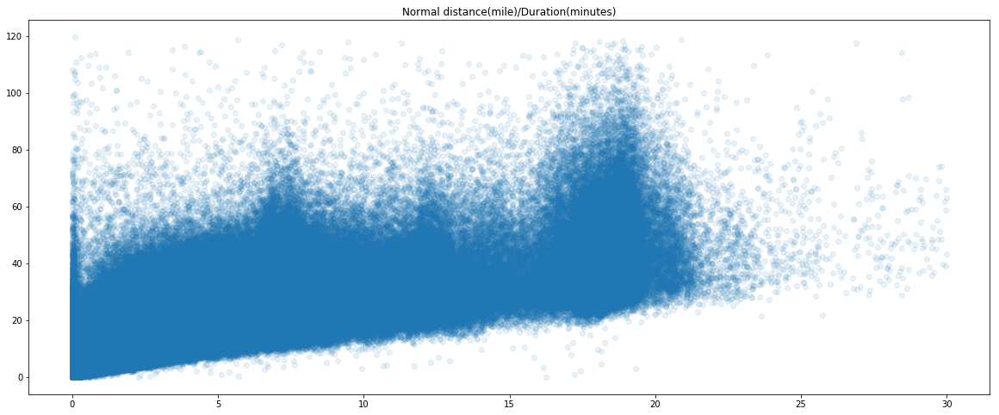

In [248]:
plt.figure(figsize=(20,8))
dic_nor=train[((train.trip_duration<7200) & (train.distance<30))]
plt.plot(dic_nor['distance'], dic_nor['trip_duration']/60, 'o',linewidth=0.1,alpha=0.1)
plt.title('Normal distance(mile)/Duration(minutes)')
plt.show()

In [108]:
nor_df=train[((train.trip_duration<3600) & (train.distance<30))]
nor_df.shape

(1446191, 12)

In [109]:
abnor_df=train[((train.trip_duration>3600) & (train.trip_duration<36000  ) |
                    ((train.distance>30) & (train.distance<100) ))]
abnor_df.shape

(10415, 12)

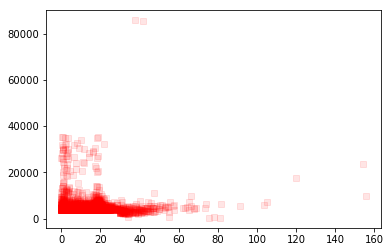

In [110]:
plt.figure()
plt.plot(abnor_df['distance'], abnor_df['trip_duration'], 'rs',linewidth=0.1,alpha=0.1)
#plt.axis([0, 0.3, 0, 4000])
plt.show()

In [112]:
train.shape[0]-nor_df.shape[0]-abnor_df.shape[0]

2038

### Possible Outlier

In [117]:
"""
It is clear that most data follow a linear model with no-linear term.
Which is already indicated in the figure "Normal distance(mile)/Duration(minutes)".
There are also outliers in the data.We will find out why.
"""

'\nIt is clear that most data follow a linear model with no-linear term.\nWhich is already indicated in the figure "Normal distance(mile)/Duration(minutes)".\nThere are also outliers in the data.We will find out why.\n'

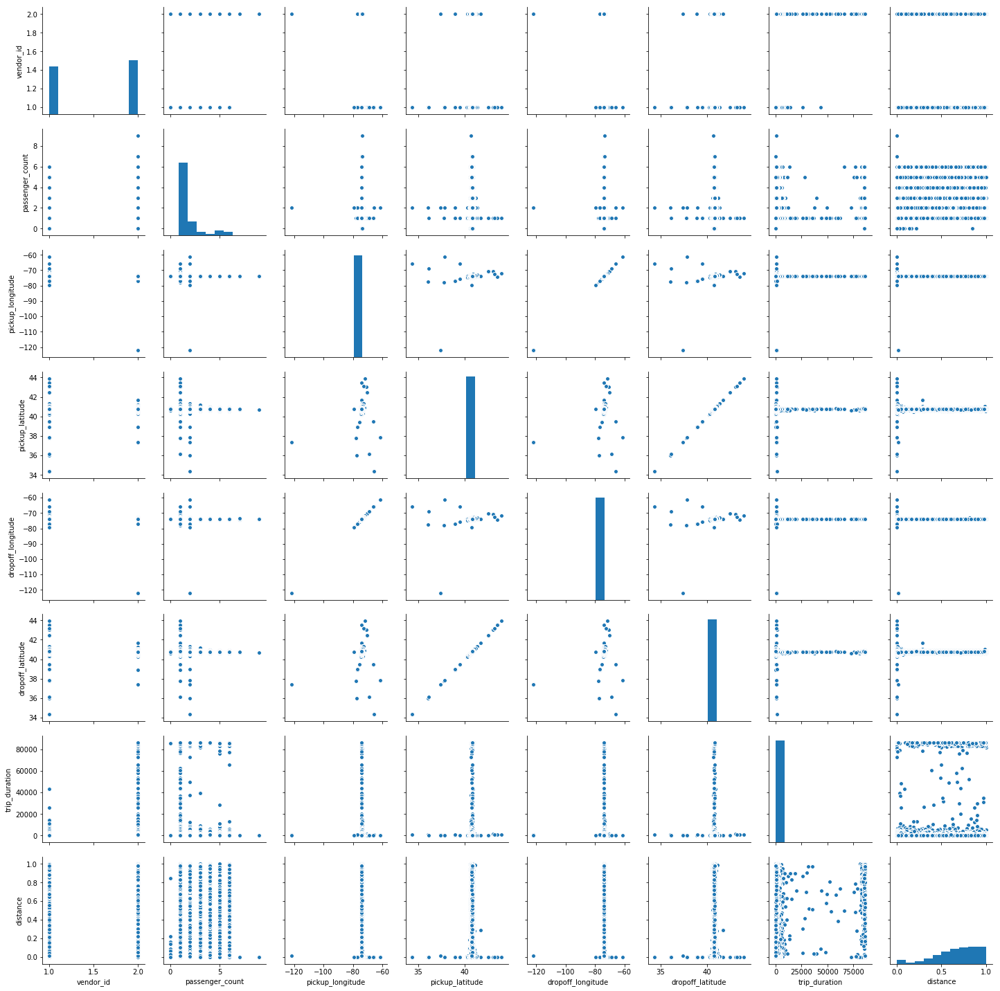

In [120]:
"""
Find out realationship when distance is less than 1 mile.
"""
sns.pairplot(train[train.distance<1])
plt.show()

In [128]:
train[train.distance<1].describe()

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration,distance
count,364923.000000,364923.000000,364923.000000,364923.000000,364923.000000,364923.000000,364923.000000,364923.000000
mean,1.532542,1.649126,-73.979029,40.753793,-73.978900,40.753890,472.385183,0.663357
std,0.498941,1.311479,0.120297,0.032548,0.120306,0.032620,2937.566810,0.238579
min,1.000000,0.000000,-121.933342,34.359695,-121.933304,34.359695,1.000000,0.000000
25%,1.000000,1.000000,-73.991440,40.740463,-73.991417,40.740524,209.000000,0.523637
50%,2.000000,1.000000,-73.982033,40.755352,-73.981644,40.755371,311.000000,0.701572
75%,2.000000,2.000000,-73.968803,40.767830,-73.969040,40.768051,456.000000,0.852738
max,2.000000,9.000000,-61.335529,43.911762,-61.335529,43.911762,86369.000000,0.999998


In [ ]:
"""
Mostly these trip happended in Manhattan.
Which can be tourists who don't know the road.
Drive picks up several passengers and go around to 
the original spot to do the business.
This could be the hypothesis.
"""

In [ ]:
"""
Could this be a measure error?
"""

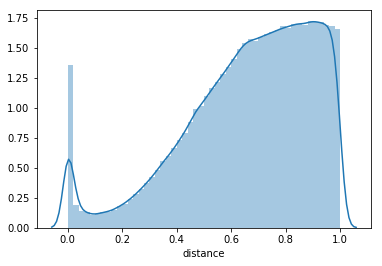

In [129]:
sns.distplot(train[train.distance<1].distance)
plt.show()

population: 359298


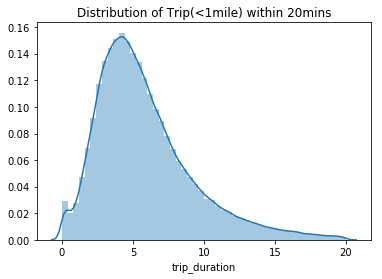

In [142]:
print("population:",train[(train.distance<1)  & (train.trip_duration<1200)].shape[0])
sns.distplot(train[(train.distance<1)  & (train.trip_duration<1200)].trip_duration/60)
plt.title('Distribution of Trip(<1mile) within 20mins')
plt.show()

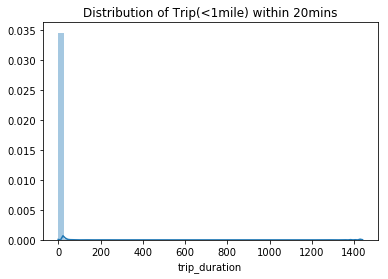

In [139]:
"""
Trip within 1 mile can be reach by feet.
So it must be outlier.
Passenger gets into the car for something else.
"""

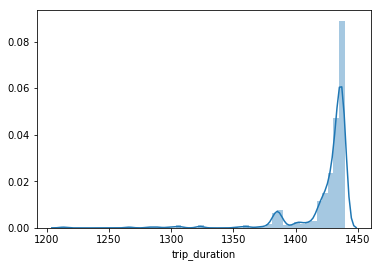

In [171]:
sns.distplot(train[(train.distance<1)  & (train.trip_duration>72000)].trip_duration/60)
plt.show()

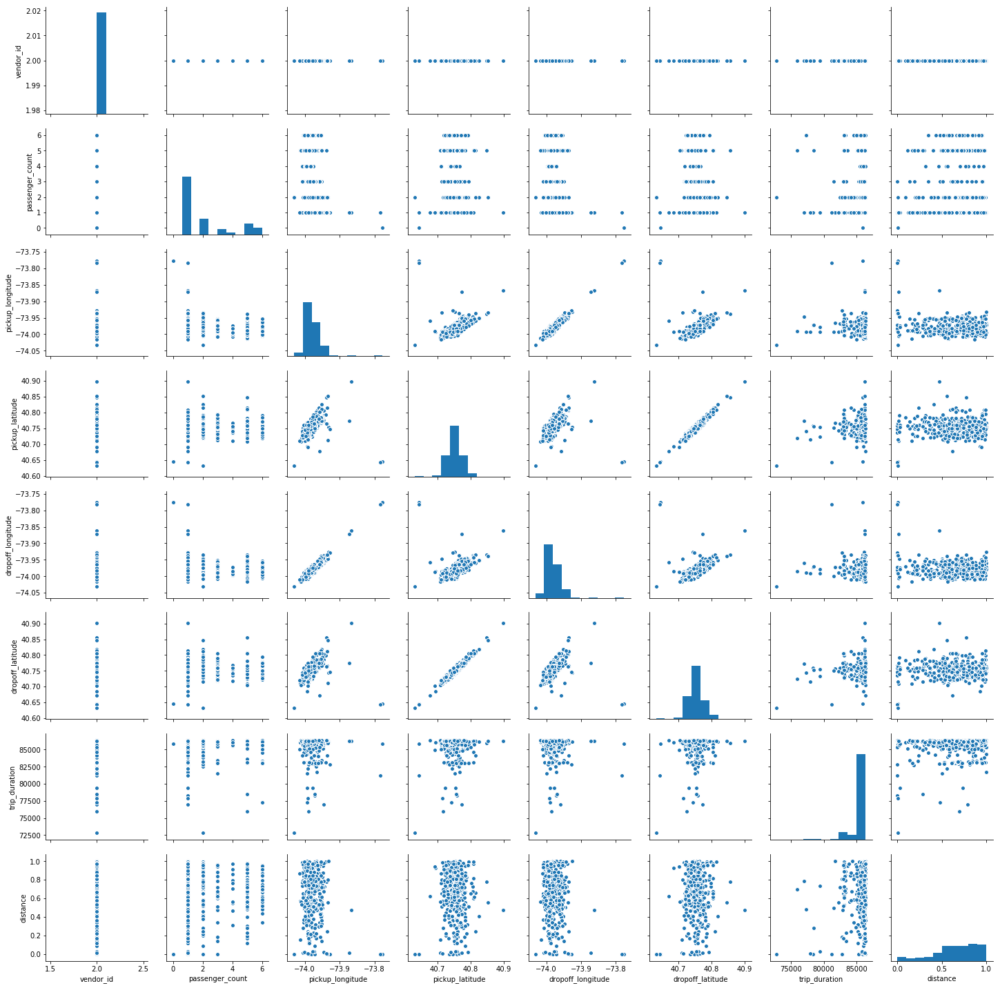

In [151]:
sns.pairplot(train[(train.distance<1)  & (train.trip_duration>72000)])
plt.show()

In [153]:
np.bincount(train[(train.distance<1)  & (train.trip_duration<1200)].vendor_id)

array([     0, 168395, 190903])

In [154]:
np.bincount(train[(train.distance<1)  & (train.trip_duration>72000)].vendor_id)

array([  0,   0, 425])

In [159]:
train[(train.distance<1)  & (train.trip_duration>72000)].store_and_fwd_flag.value_counts()

N    425
Name: store_and_fwd_flag, dtype: int64

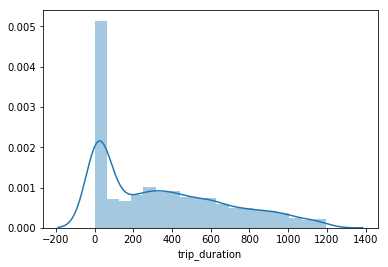

In [221]:
"""
Something also weird as fuck.
Gamma distribution
"""
sns.distplot(train[((train.distance==0)&(train.trip_duration<1200))].trip_duration)
plt.show()

In [231]:
data=train[((train.distance==0)&(train.trip_duration<7200))].trip_duration.tolist()

In [232]:
data_log=np.log10(data)

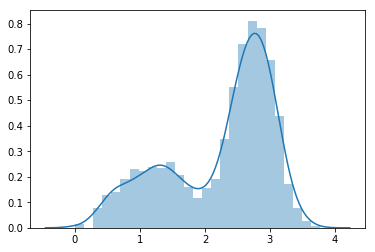

In [233]:
sns.distplot(data_log)
plt.show()

In [236]:
mu, std = stats.norm.fit(data_log)

In [253]:
print('Average estimated duration with 0 distance:',10**mu/60,'minutes')
print('Actual mean:',np.mean(data)/60,"minutes")

Average estimated duration with 0 distance: 2.92599492749 minutes
Actual mean: 8.22294140934 minutes


In [ ]:
"""
Two events happened actually.
We shall try to separate them by features.
Gaving a mean to save time.
"""

In [271]:
sample[['pickup_longitude','pickup_latitude','location']].to_csv(path+'start.csv',sep='\t', encoding='utf-8')
sample[['dropoff_longitude','dropoff_latitude','location']].to_csv(path+'end.csv',sep='\t', encoding='utf-8')

### Zero Distance Outliers

#### plot total data

In [369]:
search_result = my_gis.content.search(query="title:distribution")
map1 = my_gis.map(search_result[0])
map1

[<Item title:"distribution of start and end" type:Web Map owner:Jack_yann>]

<Item title:"distribution of start and end" type:Web Map owner:Jack_yann>
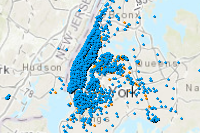

In [371]:
search_result[0]

In [ ]:
"""
Trip Type:
0. No distance
    num-r
1. Inside Manhattan
    0-0;0-1;0-2;
    1-0;1-1;1-2;
    2-0;2-1;2-2;
    0:low;1:middle;2:high
2. Brooklyn& Queen
    3-4;4-3
    3:Br;4:Qu
3. from Manhattan to Brooklyn& Queen
    0-3;0-4;
    1-3;1-4;
    2-3;2-4;
    3-0;3-1;3-2
    4-0;4-1;4-2
4. From New York to outside NY
    5: outside NY
"""

#### plot distance =0mile

In [310]:
train.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,location,distance
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455,New York,1.129202
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663,New York,1.564676
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124,New York,5.169019
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429,New York,1.037475
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435,New York,0.744691


In [312]:
zero_dic=train[train.distance==0]
zero_dic[['pickup_longitude','pickup_latitude','location']].to_csv(path+'zero_dic.csv',sep='\t', encoding='utf-8')

In [362]:
search_result = my_gis.content.search(query="title:zero_dic")
map2 = my_gis.map(search_result[0])
map2

<Item title:"zero_dic" type:Web Map owner:Jack_yann>
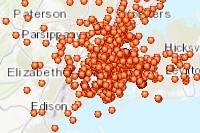

In [363]:
search_result[0]

In [325]:
"""
This is really weird and unreasonable.
Try K-means on log_duration to separate.
"""

'\nThis is really weird and unreasonable.\n'

In [328]:
from sklearn.cluster import KMeans
zero_dic['log_nor']=np.log10(np.array(zero_dic.trip_duration.tolist()))
kmeans = KMeans(n_clusters=2, random_state=0).fit(zero_dic[['distance','log_nor']])

/Users/yanxinzhou/.pyenv/versions/anaconda3-4.2.0/lib/python3.5/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


In [333]:
zero_dic['label']=kmeans.labels_

/Users/yanxinzhou/.pyenv/versions/anaconda3-4.2.0/lib/python3.5/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [337]:
zero_dic_0=zero_dic[zero_dic.label==0]
zero_dic_0[['pickup_longitude','pickup_latitude','location']].to_csv(path+'zero_0.csv',sep='\t', encoding='utf-8')

In [336]:
zero_dic_1=zero_dic[zero_dic.label==1]
zero_dic_1[['pickup_longitude','pickup_latitude','location']].to_csv(path+'zero_1.csv',sep='\t', encoding='utf-8')

In [364]:
search_result = my_gis.content.search(query="title:kmeans_0dic")
map3= my_gis.map(search_result[0])
map3

<Item title:"kmeans_0dic" type:Web Map owner:Jack_yann>
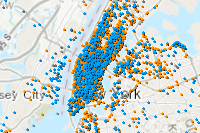

In [365]:
search_result[0]

In [ ]:
"""
The durantion is independent of geo-distribution.
""

### Outlier of speed(add speed)

In [67]:
train['speed']=np.array(train.distance.tolist())/np.array(train.trip_duration.tolist())*3600

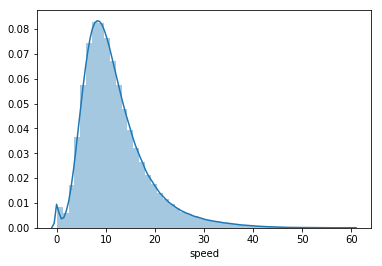

In [34]:
sns.distplot(train['speed'])
plt.show()

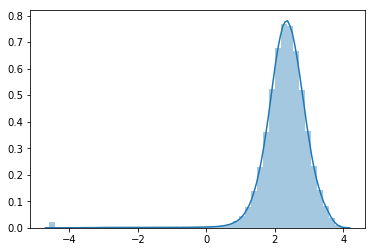

In [49]:
log_speed=np.log(np.array(train['speed'].tolist())+0.01)
sns.distplot(log_speed)
plt.show()

In [68]:
"""
Eliminate 109 outliers which has unreasonable speed
"""
train=train[train.speed<60]

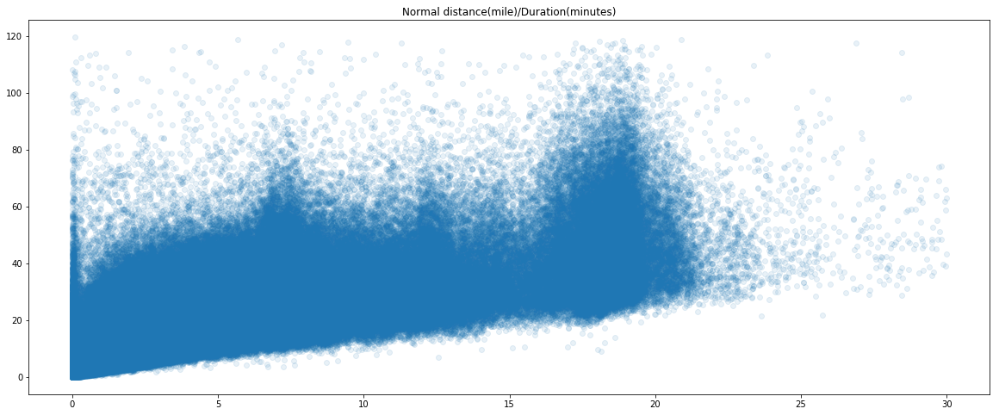

In [25]:
plt.figure(figsize=(20,8))
dic_nor=train[((train.trip_duration<7200) & (train.distance<30))]
plt.plot(dic_nor['distance'], dic_nor['trip_duration']/60, 'o',linewidth=0.1,alpha=0.1)
plt.title('Normal distance(mile)/Duration(minutes)')
plt.show()

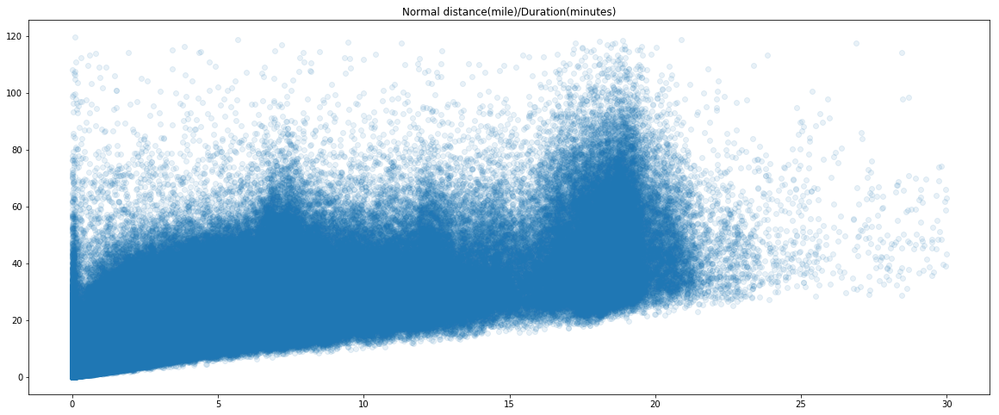

In [24]:
plt.figure(figsize=(20,8))
dic_nor=train[((train.trip_duration<7200) & (train.distance<30)&(train.speed<60))]
plt.plot(dic_nor['distance'], dic_nor['trip_duration']/60, 'o',linewidth=0.1,alpha=0.1)
plt.title('Normal distance(mile)/Duration(minutes)')
plt.show()

In [27]:
train[train.speed>60].shape 

(199, 13)

### Outlier of time(eliminate trip_duration)

In [ ]:
"""
The 60miles/hour will eliminate all the lowbound "outliers" from the data.
But is it necessary? Can the trip depends on other geo-information?(high way,Tunnel...)
It seems necessary as there are only 200 out of 1400,000s records.
"""

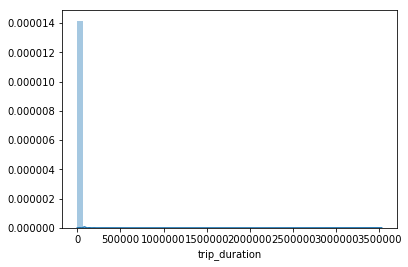

In [69]:
"""
Drop unreasonable long trip duration.
It is abnormal that someone stay in cab more than 8 hours.
Which is 28800s.
"""
sns.distplot(train['trip_duration'])
plt.show()

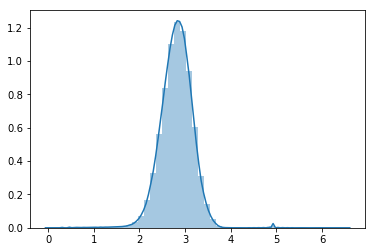

In [75]:
log_durantion=np.log10(np.array(train.trip_duration.tolist()))
sns.distplot(log_durantion)
plt.show()

In [76]:
"""
Get 99% quantile of the data.
"""
train['log_durantion']=log_durantion
train['log_durantion'].quantile([.005, .995])

0.005    1.716003
0.995    3.616895
Name: log_durantion, dtype: float64

In [78]:
train=train[((train.trip_duration>50)&(train.trip_duration<4200))]

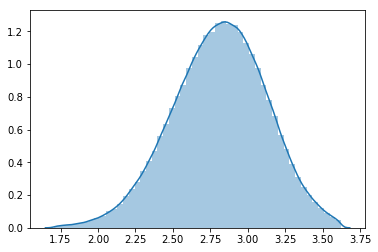

In [80]:
log_durantion=np.log10(np.array(train.trip_duration.tolist()))
sns.distplot(log_durantion)
plt.show()

### Add Location and direction

In [148]:
from geopy.geocoders import Nominatim
geolocator = Nominatim()

In [149]:
Address=["City Hall Park, New York, NY 10007","Central Park NY","Yankee Stadium NY","Flatbush - Ditmas Park NY",
               "St John's University Queens Campus NY","Staten Island"]

In [150]:
locations=list(map(geolocator.geocode,Address))

In [151]:
geolist=list(zip(Address,[[x.longitude,x.latitude] for x in locations]))

In [159]:
geolist

[('City Hall Park, New York, NY 10007', [-74.0062428541059, 40.71262475]),
 ('Central Park NY', [-73.964570666545, 40.78384615]),
 ('Yankee Stadium NY', [-73.926521184919, 40.82958275]),
 ('Flatbush - Ditmas Park NY', [-73.9608797, 40.6401454]),
 ("St John's University Queens Campus NY", [-73.7940146998428, 40.721731]),
 ('Staten Island', [-74.1496048, 40.5834557])]

In [146]:
def tozone(lon,lat):
    for i in range(len(geolist)):
        dic=todic([lon,lat],geolist[i][1])
        if i==0 and dic<2:
            return i
        elif i ==1 and dic<3:
            return i
        elif i==2 and dic< 4:
            return i
        elif i==3 and dic<6:
            return 3
        elif i==4 and dic <6:
            return i
        elif i ==5 and dic <6:
            return i
    else:
        return 6
        
def todic(geo1,geo2):
    if np.sum(np.array(geo1)-np.array(geo2))==0:
        return 0
    EARTH_RADIUS=6371
    C = math.sin(geo1[1]/57.2958)*math.sin(geo2[1]/57.2958) + \
        math.cos(geo1[1]/57.2958)*math.cos(geo2[1]/57.2958)*math.cos((geo1[0]-geo2[0])/57.2958)
    if C>1:
        return 0
    s = EARTH_RADIUS*math.acos(C)*0.621371192
    return s

In [178]:
start_zon=list(map(tozone,train.pickup_longitude,train.pickup_latitude))
end_zon=list(map(tozone,train.dropoff_longitude,train.dropoff_latitude))

In [180]:
train['start_zon']=start_zon
train['end_zon']=end_zon

In [193]:
def tocategory(zone1,zone2):
    return "{}_{}".format(zone1,zone2)
direction=list(map(tocategory,train['start_zon'],train['end_zon']))

In [4]:
train['direction']=direction

NameError: name 'direction' is not defined

### Add time

In [9]:
from datetime import datetime

In [10]:
def totimestamp(string):
    return pd.Timestamp(pd.to_datetime(string))
time=list(map(totimestamp,train.pickup_datetime))

In [21]:
train.index=time

In [36]:
train['hour']=train.index.hour
train['day']=train.index.day

In [37]:
train['t_sin_hour']=np.sin(2*np.pi*train.hour/24)
train['t_cos_hour']=np.cos(2*np.pi*train.hour/24)
train['t_sin_day']=np.sin(2*np.pi*train.day/7)
train['t_cos_day']=np.cos(2*np.pi*train.day/7)

In [100]:
mapping = {'N': 0, 'Y': 1}
train.replace({'store_and_fwd_flag':mapping})

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,...,log_durantion,start_zon,end_zon,direction,hour,day,t_sin_hour,t_cos_hour,t_sin_day,t_cos_day
2016-03-14 17:24:55,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,0,...,2.658011,1,1,1_1,17,14,-9.659258e-01,-2.588190e-01,-4.898587e-16,1.000000
2016-06-12 00:43:35,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,0,...,2.821514,6,0,6_0,0,12,0.000000e+00,1.000000e+00,-9.749279e-01,-0.222521
2016-01-19 11:35:24,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,0,...,3.327155,1,0,1_0,11,19,2.588190e-01,-9.659258e-01,-9.749279e-01,-0.222521
2016-04-06 19:32:31,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,0,...,2.632457,0,0,0_0,19,6,-9.659258e-01,2.588190e-01,-7.818315e-01,0.623490
2016-03-26 13:30:55,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,0,...,2.638489,1,1,1_1,13,26,-2.588190e-01,-9.659258e-01,-9.749279e-01,-0.222521
2016-01-30 22:01:40,id0801584,2,2016-01-30 22:01:40,2016-01-30 22:09:03,6,-73.982857,40.742195,-73.992081,40.749184,0,...,2.646404,6,1,6_1,22,30,-5.000000e-01,8.660254e-01,9.749279e-01,-0.222521
2016-06-17 22:34:59,id1813257,1,2016-06-17 22:34:59,2016-06-17 22:40:40,4,-73.969017,40.757839,-73.957405,40.765896,0,...,2.532754,1,1,1_1,22,17,-5.000000e-01,8.660254e-01,4.338837e-01,-0.900969
2016-05-21 07:54:58,id1324603,2,2016-05-21 07:54:58,2016-05-21 08:20:49,1,-73.969276,40.797779,-73.922470,40.760559,0,...,3.190612,1,1,1_1,7,21,9.659258e-01,-2.588190e-01,-7.347881e-16,1.000000
2016-05-27 23:12:23,id1301050,1,2016-05-27 23:12:23,2016-05-27 23:16:38,1,-73.999481,40.738400,-73.985786,40.732815,0,...,2.406540,0,0,0_0,23,27,-2.588190e-01,9.659258e-01,-7.818315e-01,0.623490
2016-03-10 21:45:01,id0012891,2,2016-03-10 21:45:01,2016-03-10 22:05:26,1,-73.981049,40.744339,-73.973000,40.789989,0,...,3.088136,1,1,1_1,21,10,-7.071068e-01,7.071068e-01,4.338837e-01,-0.900969


In [107]:
list(train)

['id',
 'vendor_id',
 'pickup_datetime_x',
 'dropoff_datetime',
 'passenger_count',
 'pickup_longitude',
 'pickup_latitude',
 'dropoff_longitude',
 'dropoff_latitude',
 'store_and_fwd_flag',
 'trip_duration',
 'distance',
 'speed',
 'holiday',
 'pickup_weekday',
 'pickup_hour_weekofyear',
 'pickup_hour',
 'pickup_minute',
 'pickup_dt',
 'pickup_week_hour',
 'start_zon',
 'end_zon',
 't_sin_hour',
 't_cos_hour',
 't_sin_day',
 't_cos_day',
 'total_distance',
 'total_travel_time',
 'number_of_steps',
 'align',
 'date',
 'maximum temperature',
 'minimum temperature',
 'average temperature',
 'precipitation',
 'snow fall',
 'snow depth',
 'pickup_datetime']

In [108]:
mapping = {'T': 1}
train=train.replace({'precipitation':mapping,'snow fall':mapping,'snow depth':mapping})
test=test.replace({'precipitation':mapping,'snow fall':mapping,'snow depth':mapping})

### Add weather

In [7]:
weather = pd.read_csv(path+'weather.csv',
                  usecols=['date','maximum temperature','minimum temperature','average temperature','precipitation',
         'snow fall','snow depth'])
#train = train.merge(train_street_info, how='left', on='id')
#test = test.merge(test_street_info, how='left', on='id')

In [10]:
date=list(map(todate,weather['date']))

In [12]:
weather['pickup_datetime']=pd.to_datetime(date)

In [78]:
weather['align']=list(map(tostr,weather.date.dt.year,weather.date.dt.month,weather.date.dt.day))

In [85]:
train['align']=list(map(tostr,train.pickup_datetime_x.dt.year,\
                        train.pickup_datetime_x.dt.month,train.pickup_datetime_x.dt.day))

In [166]:
test['align']=list(map(tostr,test.pickup_datetime.dt.year,\
                        test.pickup_datetime.dt.month,test.pickup_datetime.dt.day))

In [100]:
del train['pickup_datetime_y']
del test['pickup_datetime_y']
list(train)

['id',
 'vendor_id',
 'pickup_datetime_x',
 'dropoff_datetime',
 'passenger_count',
 'pickup_longitude',
 'pickup_latitude',
 'dropoff_longitude',
 'dropoff_latitude',
 'store_and_fwd_flag',
 'trip_duration',
 'distance',
 'speed',
 'holiday',
 'pickup_weekday',
 'pickup_hour_weekofyear',
 'pickup_hour',
 'pickup_minute',
 'pickup_dt',
 'pickup_week_hour',
 'start_zon',
 'end_zon',
 't_sin_hour',
 't_cos_hour',
 't_sin_day',
 't_cos_day',
 'total_distance',
 'total_travel_time',
 'number_of_steps',
 'align']

In [167]:
train = train.merge(weather, how='left', on='align')
test = test.merge(weather, how='left', on='align')

In [77]:
def tostr(y,m,d):
    return "{}-{}-{}".format(y,m,d)

In [9]:
def todate(string):
    arr=string.strip().split('-')
    return ("{}-{}-{}".format(arr[2],arr[1],arr[0]))

### summary of feature engineering

In [ ]:
fea=['vendor_id','passenger_count','store_and_fwd_flag','distance','start_zon',\
       'end_zon','hour','day','t_sin_hour','t_cos_hour','t_sin_day','t_cos_day','Type'\
        'maximum temperature','minimum temperature','average temperature','precipitation',
         'snow fall','snow depth']

In [4]:
start=list(zip(train.pickup_longitude,train.pickup_latitude))
end=list(zip(train.dropoff_longitude,train.dropoff_latitude))

In [137]:
start1=list(zip(test.pickup_longitude,test.pickup_latitude))
end1=list(zip(test.dropoff_longitude,test.dropoff_latitude))

In [138]:
def toroutine(geo1,geo2):
    if np.sum(np.array(geo1)-np.array(geo2))==0:
        return 0
    EARTH_RADIUS=6371
    a = math.sin(geo1[1]/57.2958)*math.sin(geo1[1]/57.2958) + \
        math.cos(geo1[1]/57.2958)*math.cos(geo1[1]/57.2958)*math.cos((geo1[0]-geo2[0])/57.2958)
    b = math.sin(geo1[1]/57.2958)*math.sin(geo2[1]/57.2958) + \
        math.cos(geo1[1]/57.2958)*math.cos(geo2[1]/57.2958)
    if a>1 or b>1:
        return 0
    s1 = EARTH_RADIUS*math.acos(a)*0.621371192
    s2 = EARTH_RADIUS*math.acos(b)*0.621371192
    return s1+s2

In [16]:
train['distance']=list(map(toroutine,start,end))

In [139]:
test['distance']=list(map(toroutine,start1,end1))

In [17]:
train['speed']=train['distance']/train.trip_duration*3600

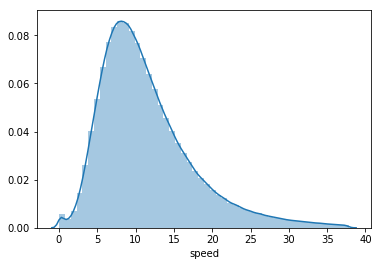

In [19]:
"""
Get 99% quantile of the data.
"""
#train['speed'].quantile([.005, .995])
sns.distplot(train[((train.speed>0.05)&(train.speed<37.8))].speed)
plt.show()

In [20]:
train['pickup_datetime'] = pd.to_datetime(train.pickup_datetime)

In [140]:
test['pickup_datetime'] = pd.to_datetime(test.pickup_datetime)

In [141]:
import holidays
us_holidays = holidays.UnitedStates()
def holiday(date):
    if date in us_holidays:
        return 1
    else:
        return 0

In [22]:
train['holiday']=list(map(holiday,train.pickup_datetime))

In [142]:
test['holiday']=list(map(holiday,test.pickup_datetime))

In [23]:
train.loc[:, 'pickup_weekday'] = train['pickup_datetime'].dt.weekday
train.loc[:, 'pickup_hour_weekofyear'] = train['pickup_datetime'].dt.weekofyear
train.loc[:, 'pickup_hour'] = train['pickup_datetime'].dt.hour
train.loc[:, 'pickup_minute'] = train['pickup_datetime'].dt.minute
train.loc[:, 'pickup_dt'] = (train['pickup_datetime'] - train['pickup_datetime'].min()).dt.total_seconds()
train.loc[:, 'pickup_week_hour'] = train['pickup_weekday'] * 24 + train['pickup_hour']

In [101]:
train.loc[:, 'pickup_month'] = train['pickup_datetime'].dt.month

In [143]:
test.loc[:, 'pickup_weekday'] = test['pickup_datetime'].dt.weekday
test.loc[:, 'pickup_hour_weekofyear'] = test['pickup_datetime'].dt.weekofyear
test.loc[:, 'pickup_hour'] = test['pickup_datetime'].dt.hour
test.loc[:, 'pickup_minute'] = test['pickup_datetime'].dt.minute
test.loc[:, 'pickup_dt'] = (test['pickup_datetime'] - test['pickup_datetime'].min()).dt.total_seconds()
test.loc[:, 'pickup_week_hour'] = test['pickup_weekday'] * 24 + test['pickup_hour']

In [144]:
test.loc[:, 'pickup_month'] = test['pickup_datetime'].dt.month

In [31]:
train['start_zon']=list(map(tozone,train.pickup_longitude,train.pickup_latitude))
train['end_zon']=list(map(tozone,train.dropoff_longitude,train.dropoff_latitude))

In [152]:
test['start_zon']=list(map(tozone,test.pickup_longitude,test.pickup_latitude))
test['end_zon']=list(map(tozone,test.dropoff_longitude,test.dropoff_latitude))

In [33]:
train['t_sin_hour']=np.sin(2*np.pi*train.pickup_hour/24)
train['t_cos_hour']=np.cos(2*np.pi*train.pickup_hour/24)
train['t_sin_day']=np.sin(2*np.pi*train.pickup_weekday/7)
train['t_cos_day']=np.cos(2*np.pi*train.pickup_weekday/7)

In [153]:
test['t_sin_hour']=np.sin(2*np.pi*test.pickup_hour/24)
test['t_cos_hour']=np.cos(2*np.pi*test.pickup_hour/24)
test['t_sin_day']=np.sin(2*np.pi*test.pickup_weekday/7)
test['t_cos_day']=np.cos(2*np.pi*test.pickup_weekday/7)

In [36]:
train['holiday'].iloc[train[((train.pickup_weekday==0) | (train.pickup_weekday==6))].index]=1

/Users/yanxinzhou/.pyenv/versions/anaconda3-4.2.0/lib/python3.5/site-packages/pandas/core/indexing.py:194: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [154]:
test['holiday'].iloc[test[((test.pickup_weekday==0) | (test.pickup_weekday==6))].index]=1

/Users/yanxinzhou/.pyenv/versions/anaconda3-4.2.0/lib/python3.5/site-packages/pandas/core/indexing.py:194: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [155]:
fr1 = pd.read_csv(path+'fastest_routes_train_part_1.csv',
                  usecols=['id', 'total_distance', 'total_travel_time',  'number_of_steps'])
fr2 = pd.read_csv(path+'fastest_routes_train_part_2.csv',
                  usecols=['id', 'total_distance', 'total_travel_time', 'number_of_steps'])
test_street_info = pd.read_csv(path+'fastest_routes_test.csv',
                               usecols=['id', 'total_distance', 'total_travel_time', 'number_of_steps'])
train_street_info = pd.concat((fr1, fr2))
train = train.merge(train_street_info, how='left', on='id')
test = test.merge(test_street_info, how='left', on='id')

In [54]:
train=train.dropna(axis=0, how='any')

In [156]:
mapping = {'N': 0, 'Y': 1}
#train=train.replace({'store_and_fwd_flag':mapping})
test=test.replace({'store_and_fwd_flag':mapping})

In [171]:
mapping = {'T': 1}
train=train.replace({'precipitation':mapping,'snow fall':mapping,'snow depth':mapping})
test=test.replace({'precipitation':mapping,'snow fall':mapping,'snow depth':mapping})
train[['precipitation','snow fall','snow depth']]\
        =train[['precipitation','snow fall','snow depth']].astype(float)
test[['precipitation','snow fall','snow depth']]\
        =test[['precipitation','snow fall','snow depth']].astype(float)

In [53]:
train_street_info = pd.read_csv(path+'second_fastest_routes_train.csv',
                  usecols=['id', 'total_distance', 'total_travel_time',  'number_of_steps'])

test_street_info = pd.read_csv(path+'second_fastest_routes_test.csv',
                               usecols=['id', 'total_distance', 'total_travel_time', 'number_of_steps'])

test_street_info=test_street_info.rename(columns={'total_distance':'total_distance_2th', 
                                                      'total_travel_time':'total_travel_time_2th',
                                                          'number_of_steps':'number_of_steps_2th'})
train_street_info=train_street_info.rename(columns={'total_distance':'total_distance_2th', 
                                                      'total_travel_time':'total_travel_time_2th',
                                                          'number_of_steps':'number_of_steps_2th'})

train_street_info = train_street_info.drop_duplicates(subset='id', keep='last')
test_street_info = test_street_info.drop_duplicates(subset='id', keep='last')

train = train.merge(train_street_info, how='left', on='id')
test = test.merge(test_street_info, how='left', on='id')

In [74]:
def tocategory(zone1,zone2):
    return zone1*7+zone2
train['direction']=list(map(tocategory,train['start_zon'],train['end_zon']))
test['direction']=list(map(tocategory,test['start_zon'],test['end_zon']))

In [93]:
train=train.rename(columns={'pickup_hour_weekofyear':'pickup_weekofyear'})
test=test.rename(columns={'pickup_hour_weekofyear':'pickup_weekofyear'})

In [141]:
train['log_dic']=np.log(np.array(train.distance.tolist())+1)
test['log_dic']=np.log(np.array(test.distance.tolist())+1)

In [153]:
train['short_trip']=train.distance<1.5
train['short_trip']=train['short_trip'].astype(int)
test['short_trip']=test.distance<1.5
test['short_trip']=test['short_trip'].astype(int)

In [179]:
from sklearn.decomposition import PCA
coords = np.vstack((train[['pickup_latitude', 'pickup_longitude']].values,
                    train[['dropoff_latitude', 'dropoff_longitude']].values,
                    test[['pickup_latitude', 'pickup_longitude']].values,
                    test[['dropoff_latitude', 'dropoff_longitude']].values))
pca = PCA().fit(coords)
train['pickup_pca0'] = pca.transform(train[['pickup_latitude', 'pickup_longitude']])[:, 0]
train['pickup_pca1'] = pca.transform(train[['pickup_latitude', 'pickup_longitude']])[:, 1]
train['dropoff_pca0'] = pca.transform(train[['dropoff_latitude', 'dropoff_longitude']])[:, 0]
train['dropoff_pca1'] = pca.transform(train[['dropoff_latitude', 'dropoff_longitude']])[:, 1]
test['pickup_pca0'] = pca.transform(test[['pickup_latitude', 'pickup_longitude']])[:, 0]
test['pickup_pca1'] = pca.transform(test[['pickup_latitude', 'pickup_longitude']])[:, 1]
test['dropoff_pca0'] = pca.transform(test[['dropoff_latitude', 'dropoff_longitude']])[:, 0]
test['dropoff_pca1'] = pca.transform(test[['dropoff_latitude', 'dropoff_longitude']])[:, 1]

In [4]:
list(train)

['id',
 'vendor_id',
 'pickup_datetime_x',
 'dropoff_datetime',
 'passenger_count',
 'pickup_longitude',
 'pickup_latitude',
 'dropoff_longitude',
 'dropoff_latitude',
 'store_and_fwd_flag',
 'trip_duration',
 'distance',
 'speed',
 'holiday',
 'pickup_weekday',
 'pickup_weekofyear',
 'pickup_hour',
 'pickup_minute',
 'pickup_dt',
 'pickup_week_hour',
 'start_zon',
 'end_zon',
 't_sin_hour',
 't_cos_hour',
 't_sin_day',
 't_cos_day',
 'total_distance',
 'total_travel_time',
 'number_of_steps',
 'align',
 'date',
 'maximum temperature',
 'minimum temperature',
 'average temperature',
 'precipitation',
 'snow fall',
 'snow depth',
 'pickup_datetime',
 'Type',
 'log_sp',
 'direction',
 'log_dic',
 'short_trip',
 'pickup_pca0',
 'pickup_pca1',
 'dropoff_pca0',
 'dropoff_pca1']

### Save/Load

In [17]:
import pickle

time=str(datetime.datetime.now())
stamp=time.strip().split(' ')
temp=stamp[1].strip().split(':')
stamp=stamp[0]+'_'+temp[0]+"_"+temp[1]

output = open(path+stamp+'_train.pkl', 'wb')
pickle.dump(train,output)

output1 = open(path+stamp+'_test.pkl', 'wb')
pickle.dump(test,output1)

In [10]:
pkl_file = open(path+'2018-03-31_00_38_train.pkl', 'rb')
train=pickle.load(pkl_file)

pkl_file = open(path+'2018-03-31_00_38_test.pkl', 'rb')
test=pickle.load(pkl_file)

In [4]:
list(train)

['id',
 'vendor_id',
 'pickup_datetime_x',
 'dropoff_datetime',
 'passenger_count',
 'pickup_longitude',
 'pickup_latitude',
 'dropoff_longitude',
 'dropoff_latitude',
 'store_and_fwd_flag',
 'trip_duration',
 'distance',
 'speed',
 'holiday',
 'pickup_weekday',
 'pickup_hour_weekofyear',
 'pickup_hour',
 'pickup_minute',
 'pickup_dt',
 'pickup_week_hour',
 'start_zon',
 'end_zon',
 't_sin_hour',
 't_cos_hour',
 't_sin_day',
 't_cos_day',
 'total_distance',
 'total_travel_time',
 'number_of_steps',
 'align',
 'date',
 'maximum temperature',
 'minimum temperature',
 'average temperature',
 'precipitation',
 'snow fall',
 'snow depth',
 'pickup_datetime']

## Moderl Training

In [95]:
scores=[]## store all the prediction  score for different models 

### Baseline model

In [ ]:
"""
The baseline model is the existing data of New fastest_routes record.
"""

In [30]:
out_put=test[['id','total_travel_time']]
#out_put.index=out_put.id
out_put=out_put.rename(columns={"total_travel_time":"trip_duration"})
#del out_put['id']
out_put.to_csv(path+"bl.csv")

In [99]:
scores.append(['Baseline',0.99])

In [58]:
out_put=test[['id','total_travel_time_2th']]
out_put.index=out_put.id
out_put=out_put.rename(columns={"total_travel_time_2th":"trip_duration"})
del out_put['id']
out_put=out_put.fillna(0)
out_put.to_csv(path+"bl_2th.csv")


In [57]:
out_put

,trip_duration
id,
id3004672,439.5
id3505355,0.0
id1217141,0.0
id2150126,530.8
id1598245,0.0
id0668992,0.0
id1765014,746.3
id0898117,515.7
id3905224,1339.8


### Linear regression Model

In [ ]:
"""
1. Train_Test split
2. Hypothesis:
        h(x)=f(time,trigonometric terms,direction,distance)
3. Model:
        y=bais+b1time+b2*distance+b3*trigonometric terms+b4*Dummy varaible
            +b5*interaction terms
4. Dummy Value:
        map direction to 0/1 terms
5. Cooks_distance test:
6. Leverage Test:
7. Delet covariant infered from y
8. Train model
"""

In [42]:
LR_df=train.copy()

In [47]:
LR_df['direction'].value_counts()

1_1    666982
0_0    148932
0_1    117828
1_0    109822
1_6     61679
6_1     59190
0_6     39252
6_0     37604
4_1     33182
1_4     25904
0_3     24630
6_6     16825
1_2     13175
1_3     13040
3_3     12221
4_4     10154
4_0      9931
4_3      8984
0_4      6667
4_6      5393
6_3      3954
3_0      3593
6_4      2836
0_2      2355
2_1      1835
3_1      1701
4_2      1614
2_2      1530
3_6      1058
6_2       987
3_4       543
2_6       186
2_0       132
1_5       111
2_4       103
0_5        95
3_2        91
4_5        73
5_5        47
2_3        29
6_5        18
3_5         5
5_6         2
5_4         1
5_3         1
Name: direction, dtype: int64

In [147]:
LR_df.index=range(LR_df.shape[0])

In [149]:
"""
Too many terms, so to shrink the direction, time 
to 6 types(prior number) 0-10,10-20,...50-60miles/hour
"""
LR_df['Type'].iloc[LR_df[LR_df.speed<10].index]=0
LR_df['Type'].iloc[LR_df[(LR_df.speed>10)&(LR_df.speed<20)].index]=1
LR_df['Type'].iloc[LR_df[(LR_df.speed>20)&(LR_df.speed<30)].index]=2
LR_df['Type'].iloc[LR_df[(LR_df.speed>30)].index]=3

/Users/yanxinzhou/.pyenv/versions/anaconda3-4.2.0/lib/python3.5/site-packages/pandas/core/indexing.py:194: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [150]:
LR_df['Type'].value_counts()

0    677339
1    615422
2    119418
3     32116
Name: Type, dtype: int64

In [151]:
LR_df['Type']=LR_df['Type'].astype(int)

In [152]:
### Type detector
sh=[x for x in range(LR_df.shape[0])]
np.random.shuffle(sh)
LR_train=LR_df.iloc[sh][:int(LR_df.shape[0]*0.5)]
LR_test=LR_df.iloc[sh][int(LR_df.shape[0]*0.5):]

In [19]:
features=['passenger_count','hour','start_zon','end_zon','day','pickup_longitude',\
         'pickup_latitude','dropoff_longitude','dropoff_latitude','distance']

In [162]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(criterion='entropy',max_depth=15,
                                 min_samples_split=100,random_state=0,class_weight='balanced')
clf.fit(LR_train[features], LR_train['Type'])

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='entropy', max_depth=15, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=100, min_weight_fraction_leaf=0.0,
            n_estimators=10, n_jobs=1, oob_score=False, random_state=0,
            verbose=0, warm_start=False)

In [163]:
pred=clf.predict(LR_test[features])
print(classification_report(LR_test['Type'], pred, target_names=['0','1','2','3'])) 

In [96]:
"""
The classifier turns out to be O.K with
the Test data. So it is feasible to map
features to 3 types.
"""

N    1436490
Y       7805
Name: store_and_fwd_flag, dtype: int64

In [165]:
mapping = {'N': 0, 'Y': 1}
LR_df=LR_df.replace({'store_and_fwd_flag':mapping})
#LR_df['store_and_fwd_flag']=LR_df['store_and_fwd_flag'].astype(int)

TypeError: Cannot compare types 'ndarray(dtype=int64)' and 'str'

In [166]:
#list(LR_df)
fea=['vendor_id','passenger_count','store_and_fwd_flag','distance','start_zon',\
       'end_zon','hour','day','t_sin_hour','t_cos_hour','t_sin_day','t_cos_day','Type']
y=LR_df['trip_duration']
X=LR_df[fea]

In [168]:
for f in fea:
    print(X[f].dtype)

int64
int64
int64
float64
int64
int64
int64
int64
float64
float64
float64
float64
int64


In [169]:
fea_list=list(X)
for i in range(len(fea_list)):
    for j in range(len(fea_list)):
        if i !=j:
            name="{}X{}".format(fea_list[i],fea_list[j])
            X[name]=X[fea_list[i]]*X[fea_list[j]]

/Users/yanxinzhou/.pyenv/versions/anaconda3-4.2.0/lib/python3.5/site-packages/ipykernel/__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


#### simple linear model

In [170]:
sh=[x for x in range(X.shape[0])]
np.random.shuffle(sh)
X_train=X.iloc[sh][:int(X.shape[0]*0.5)]
y_train=y.iloc[sh][:int(y.shape[0]*0.5)]
X_test=X.iloc[sh][int(X.shape[0]*0.5):]
y_test=y.iloc[sh][int(y.shape[0]*0.5):]

In [171]:
from sklearn.linear_model import Ridge
clf_lr = Ridge(alpha=1.0,normalize=True,fit_intercept=True)
clf_lr.fit(X_train, np.log(y_train.tolist())) 
pred=clf_lr.predict(X_test)

In [172]:
def rmsle(y_true,y_pred):
    assert len(y_true) == len(y_pred)
    return np.square(np.log(y_pred + 1) - np.log(y_true + 1)).mean() ** 0.5

In [173]:
rmsle(y_test,np.exp(pred))

0.4907753152777241

In [ ]:
fea=['vendor_id','passenger_count','store_and_fwd_flag','distance','start_zon',\
       'end_zon','hour','day','t_sin_hour','t_cos_hour','t_sin_day','t_cos_day','Type']

In [181]:
list(train)

['id',
 'vendor_id',
 'pickup_datetime',
 'dropoff_datetime',
 'passenger_count',
 'pickup_longitude',
 'pickup_latitude',
 'dropoff_longitude',
 'dropoff_latitude',
 'store_and_fwd_flag',
 'trip_duration',
 'distance',
 'speed',
 'log_durantion',
 'start_zon',
 'end_zon',
 'direction',
 'hour',
 'day',
 't_sin_hour',
 't_cos_hour',
 't_sin_day',
 't_cos_day',
 'Type']

In [179]:
train['Type']=0
train.index=range(train.shape[0])
train['Type'].iloc[train[train.speed<10].index]=0
train['Type'].iloc[train[(train.speed>10)&(train.speed<20)].index]=1
train['Type'].iloc[train[(train.speed>20)&(train.speed<30)].index]=2
train['Type'].iloc[train[(train.speed>30)].index]=3

/Users/yanxinzhou/.pyenv/versions/anaconda3-4.2.0/lib/python3.5/site-packages/pandas/core/indexing.py:194: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [219]:
train_y=train['trip_duration']
train_X=train[fea]

In [227]:
for f in fea:
    print(f,train_X[f].dtype)

vendor_id int64
passenger_count int64
store_and_fwd_flag object
distance float64
start_zon int64
end_zon int64
hour int64
day int64
t_sin_hour float64
t_cos_hour float64
t_sin_day float64
t_cos_day float64
Type int64


In [228]:
mapping = {'N': 0, 'Y': 1}
train_X=train_X.replace({'store_and_fwd_flag':mapping})

In [222]:
fea_list=list(train_X)
fea_list

['vendor_id',
 'passenger_count',
 'store_and_fwd_flag',
 'distance',
 'start_zon',
 'end_zon',
 'hour',
 'day',
 't_sin_hour',
 't_cos_hour',
 't_sin_day',
 't_cos_day',
 'Type']

In [229]:
interaction_fea=[]
for i in range(len(fea_list)):
    for j in range(len(fea_list)):
        if i !=j:
            name="{}X{}".format(fea_list[i],fea_list[j])
            train_X[name]=train_X[fea_list[i]]*train_X[fea_list[j]]
            interaction_fea.append(name)

In [230]:
fea_f=fea+interaction_fea
fea_f

['vendor_id',
 'passenger_count',
 'store_and_fwd_flag',
 'distance',
 'start_zon',
 'end_zon',
 'hour',
 'day',
 't_sin_hour',
 't_cos_hour',
 't_sin_day',
 't_cos_day',
 'Type',
 'vendor_idXpassenger_count',
 'vendor_idXstore_and_fwd_flag',
 'vendor_idXdistance',
 'vendor_idXstart_zon',
 'vendor_idXend_zon',
 'vendor_idXhour',
 'vendor_idXday',
 'vendor_idXt_sin_hour',
 'vendor_idXt_cos_hour',
 'vendor_idXt_sin_day',
 'vendor_idXt_cos_day',
 'vendor_idXType',
 'passenger_countXvendor_id',
 'passenger_countXstore_and_fwd_flag',
 'passenger_countXdistance',
 'passenger_countXstart_zon',
 'passenger_countXend_zon',
 'passenger_countXhour',
 'passenger_countXday',
 'passenger_countXt_sin_hour',
 'passenger_countXt_cos_hour',
 'passenger_countXt_sin_day',
 'passenger_countXt_cos_day',
 'passenger_countXType',
 'store_and_fwd_flagXvendor_id',
 'store_and_fwd_flagXpassenger_count',
 'store_and_fwd_flagXdistance',
 'store_and_fwd_flagXstart_zon',
 'store_and_fwd_flagXend_zon',
 'store_and_fw

In [231]:
set(fea_f)-(set(list(train_X)) & set(fea_f))

set()

In [208]:
test['distance']=np.abs(test['pickup_longitude']-test['dropoff_longitude'])*55.2428 +\
                np.abs(test['pickup_latitude']-test['dropoff_latitude'])*69

In [198]:
start_zon=list(map(tozone,test.pickup_longitude,test.pickup_latitude))
end_zon=list(map(tozone,test.dropoff_longitude,test.dropoff_latitude))
test['start_zon']=start_zon
test['end_zon']=end_zon

In [199]:
def totimestamp(string):
    return pd.Timestamp(pd.to_datetime(string))
time=list(map(totimestamp,test.pickup_datetime))

In [202]:
test.index=time

In [203]:
test['hour']=test.index.hour
test['day']=test.index.day
test['t_sin_hour']=np.sin(2*np.pi*test.hour/24)
test['t_cos_hour']=np.cos(2*np.pi*test.hour/24)
test['t_sin_day']=np.sin(2*np.pi*test.day/7)
test['t_cos_day']=np.cos(2*np.pi*test.day/7)

In [232]:
mapping = {'N': 0, 'Y': 1}
test=test.replace({'store_and_fwd_flag':mapping})

In [233]:
for i in range(len(fea_list)):
    for j in range(len(fea_list)):
        if i !=j:
            name="{}X{}".format(fea_list[i],fea_list[j])
            test[name]=test[fea_list[i]]*test[fea_list[j]]

In [205]:
features=['passenger_count','hour','start_zon','end_zon','day','pickup_longitude',\
         'pickup_latitude','dropoff_longitude','dropoff_latitude','distance']
clf = RandomForestClassifier(criterion='entropy',max_depth=15,
                                 min_samples_split=100,random_state=0,class_weight='balanced')
clf.fit(train[features], train['Type'])

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='entropy', max_depth=15, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=100, min_weight_fraction_leaf=0.0,
            n_estimators=10, n_jobs=1, oob_score=False, random_state=0,
            verbose=0, warm_start=False)

In [209]:
set(features)-(set(list(test)) & set(features))

set()

In [210]:
test_type=clf.predict(test[features])

In [213]:
test['Type']=test_type

In [234]:
set(fea_f)-(set(list(test)) & set(fea_f))

set()

In [217]:
test.index=range(test.shape[0])

#### H0 of LR: distance = 0 is the same behavior

In [235]:
clf_lr = Ridge(alpha=0.1,normalize=True,fit_intercept=True)
clf_lr.fit(train_X, np.log(train_y.tolist())) 

Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=True, random_state=None, solver='auto', tol=0.001)

In [236]:
pred=clf_lr.predict(test[fea_f])

In [239]:
pred=np.exp(pred)

In [256]:
lr_h0=pd.DataFrame({'trip_duration':pred},columns=['trip_duration'],index=test.id)

In [259]:
list(test)

['id',
 'vendor_id',
 'pickup_datetime',
 'passenger_count',
 'pickup_longitude',
 'pickup_latitude',
 'dropoff_longitude',
 'dropoff_latitude',
 'store_and_fwd_flag',
 'start_zon',
 'end_zon',
 'hour',
 'day',
 't_sin_hour',
 't_cos_hour',
 't_sin_day',
 't_cos_day',
 'distance',
 'Type',
 'vendor_idXpassenger_count',
 'vendor_idXstore_and_fwd_flag',
 'vendor_idXdistance',
 'vendor_idXstart_zon',
 'vendor_idXend_zon',
 'vendor_idXhour',
 'vendor_idXday',
 'vendor_idXt_sin_hour',
 'vendor_idXt_cos_hour',
 'vendor_idXt_sin_day',
 'vendor_idXt_cos_day',
 'vendor_idXType',
 'passenger_countXvendor_id',
 'passenger_countXstore_and_fwd_flag',
 'passenger_countXdistance',
 'passenger_countXstart_zon',
 'passenger_countXend_zon',
 'passenger_countXhour',
 'passenger_countXday',
 'passenger_countXt_sin_hour',
 'passenger_countXt_cos_hour',
 'passenger_countXt_sin_day',
 'passenger_countXt_cos_day',
 'passenger_countXType',
 'store_and_fwd_flagXvendor_id',
 'store_and_fwd_flagXpassenger_count',

In [258]:
lr_h0.to_csv(path+'lr_h0.csv')


In [261]:
output1 = open(path+'train_lr.pkl', 'wb')
pickle.dump(train_X,output1)
output2 = open(path+'test_lr.pkl', 'wb')
pickle.dump(test,output2)

#### H1: distance 0 is another behavior

In [267]:
p_box=[0.0001,0.001]
for a in p_box:
    clf_lr = Ridge(alpha=a,normalize=True,fit_intercept=True)
    clf_lr.fit(train_X, np.log(train_y.tolist())) 
    pred=clf_lr.predict(test[fea_f])
    pred=np.exp(pred)
    lr_h0=pd.DataFrame({'trip_duration':pred},columns=['trip_duration'],index=test.id)
    lr_h0.to_csv(path+'lr_h0_{}.csv'.format(a))

In [280]:
coef=list(zip(list(test[fea_f]),np.abs(clf_lr.coef_)))

In [282]:
from operator import itemgetter, attrgetter, methodcaller
sorted(coef, key=itemgetter(1), reverse=True)

[('Type', 0.3791817830564459),
 ('distance', 0.37268706635851578),
 ('t_sin_hour', 0.11326415764162377),
 ('store_and_fwd_flagXType', 0.053642627766424436),
 ('TypeXstore_and_fwd_flag', 0.053642627766334244),
 ('t_cos_hourXt_sin_hour', 0.046448971234979305),
 ('t_sin_hourXt_cos_hour', 0.046448971234973234),
 ('passenger_count', 0.04362149814753568),
 ('TypeXt_cos_hour', 0.043066145429952102),
 ('t_cos_hourXType', 0.043066145429951831),
 ('distanceXType', 0.030912042870345852),
 ('TypeXdistance', 0.030912042870317631),
 ('vendor_id', 0.027840313408108046),
 ('start_zon', 0.020501631085266054),
 ('TypeXstart_zon', 0.019576509372278006),
 ('start_zonXType', 0.019576509372275293),
 ('store_and_fwd_flagXvendor_id', 0.019445715160512161),
 ('vendor_idXstore_and_fwd_flag', 0.019445715160459818),
 ('store_and_fwd_flag', 0.019445715160437218),
 ('store_and_fwd_flagXt_sin_hour', 0.017244738880025024),
 ('t_sin_hourXstore_and_fwd_flag', 0.017244738879960298),
 ('store_and_fwd_flagXdistance', 0.01

In [98]:
scores.append(['Linear Regression',0.61])

In [ ]:
"""
conclusion of baseline model:
1. type
2. distance
3. time of day(trigometric)

Next step:
How to specify type?
Numerically,or categorically?
How to specify distance?
"""

### model2: xgboost

In [31]:
feature_names = list(train.columns)
print(np.setdiff1d(train.columns, test.columns))
do_not_use_for_training = ['id', 'log_trip_duration', 'pickup_datetime', 'dropoff_datetime',
                           'trip_duration', 'check_trip_duration',
                           'pickup_date', 'avg_speed_h', 'avg_speed_m',
                           'pickup_lat_bin', 'pickup_long_bin',
                           'center_lat_bin', 'center_long_bin',
                           'pickup_dt_bin', 'pickup_datetime_group',"speed",
                           'number_of_steps','algin','align','date','pickup_datetime_y'
                              ,'pickup_datetime_x']
feature_names = [f for f in train.columns if f not in do_not_use_for_training]
feature_names

['dropoff_datetime' 'log_sp' 'pickup_datetime' 'speed' 'trip_duration']


['vendor_id',
 'passenger_count',
 'pickup_longitude',
 'pickup_latitude',
 'dropoff_longitude',
 'dropoff_latitude',
 'store_and_fwd_flag',
 'distance',
 'holiday',
 'pickup_weekday',
 'pickup_hour_weekofyear',
 'pickup_hour',
 'pickup_minute',
 'pickup_dt',
 'pickup_week_hour',
 'start_zon',
 'end_zon',
 't_sin_hour',
 't_cos_hour',
 't_sin_day',
 't_cos_day',
 'total_distance',
 'total_travel_time',
 'maximum temperature',
 'minimum temperature',
 'average temperature',
 'precipitation',
 'snow fall',
 'snow depth',
 'Type',
 'log_sp']

In [30]:
list(train)
feature_names

['vendor_id',
 'passenger_count',
 'pickup_longitude',
 'pickup_latitude',
 'dropoff_longitude',
 'dropoff_latitude',
 'store_and_fwd_flag',
 'distance',
 'holiday',
 'pickup_weekday',
 'pickup_hour_weekofyear',
 'pickup_hour',
 'pickup_minute',
 'pickup_dt',
 'pickup_week_hour',
 'start_zon',
 'end_zon',
 't_sin_hour',
 't_cos_hour',
 't_sin_day',
 't_cos_day',
 'total_distance',
 'total_travel_time',
 'maximum temperature',
 'minimum temperature',
 'average temperature',
 'precipitation',
 'snow fall',
 'snow depth',
 'Type',
 'log_sp']

In [193]:
train['speed'].quantile([.005, .995])
train=train[((train.speed>0.05)&(train.speed<37.7))]

In [32]:
from sklearn.model_selection import train_test_split
y=np.log(train['trip_duration'].tolist())
Xtr, Xv, ytr, yv = train_test_split(train[feature_names].values, y, test_size=0.2, random_state=1987)

In [173]:
for f in feature_names:
    print(f,test[f].dtype)

vendor_id int64
passenger_count int64
pickup_longitude float64
pickup_latitude float64
dropoff_longitude float64
dropoff_latitude float64
store_and_fwd_flag int64
distance float64
holiday int64
pickup_weekday int64
pickup_hour_weekofyear int64
pickup_hour int64
pickup_minute int64
pickup_dt float64
pickup_week_hour int64
start_zon int64
end_zon int64
t_sin_hour float64
t_cos_hour float64
t_sin_day float64
t_cos_day float64
total_distance float64
total_travel_time float64
maximum temperature int64
minimum temperature int64
average temperature float64
precipitation float64
snow fall float64
snow depth float64


In [195]:
import xgboost as xgb
dtrain = xgb.DMatrix(Xtr, label=ytr)
dvalid = xgb.DMatrix(Xv, label=yv)
dtest = xgb.DMatrix(test[feature_names].values)
watchlist = [(dtrain, 'train'), (dvalid, 'valid')]

In [196]:
xgb_pars = {'min_child_weight': 50, 'eta': 0.3, 'colsample_bytree': 0.3, 'max_depth': 10,
            'subsample': 0.8, 'lambda': 1, 'nthread': 4, 'booster' : 'gbtree', 'silent': 1,
            'eval_metric': 'rmse', 'objective': 'reg:linear'}

In [197]:
model = xgb.train(xgb_pars, dtrain, 60, watchlist, early_stopping_rounds=50,
                  maximize=False, verbose_eval=10)

[0]	train-rmse:4.22385	valid-rmse:4.22415
Multiple eval metrics have been passed: 'valid-rmse' will be used for early stopping.

Will train until valid-rmse hasn't improved in 50 rounds.
[10]	train-rmse:0.394605	valid-rmse:0.401839
[20]	train-rmse:0.360884	valid-rmse:0.371537
[30]	train-rmse:0.350368	valid-rmse:0.363672
[40]	train-rmse:0.34457	valid-rmse:0.360318
[50]	train-rmse:0.340394	valid-rmse:0.35813
[59]	train-rmse:0.337574	valid-rmse:0.356965


In [198]:
ytest = model.predict(dtest)
preds=np.exp(ytest)
xgb_1=pd.DataFrame({'trip_duration':preds},columns=['trip_duration'],index=test.id)
xgb_1.to_csv(path+'xgb_5.csv')
scores.append(['Xgb',0.39])

### question of outlier

In [ ]:
"""
If only train XGb on 99% quantile data on speed, the result will be much better.
Because the outliers in 1%.
It also indicates an oportunity and also showed in the LR model.
The Type, the most important feature in LR model.
If we can give clear type of the trip and find pattern of the "outliers".
(Now I really double this is outlier or another behavior.)
The model will turn out be more complete and achieve better result.
Next step is try to speparate "outliers" for normal data.
"""

In [23]:
train['log_sp']=np.log(np.array(train.speed.tolist())+1)
train['log_sp'].quantile([.005, .995])

0.005    0.046075
0.995    3.655917
Name: log_sp, dtype: float64

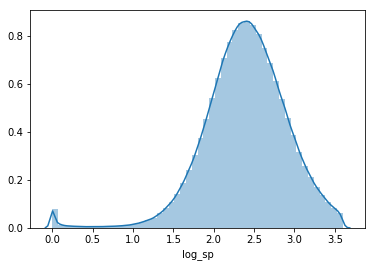

In [88]:
sns.distplot(train[((train.log_sp>-3)&(train.log_sp<3.6))].log_sp)
plt.show()

In [91]:
from scipy.stats import norm
from scipy import stats
mu, std = stats.norm.fit(train.log_sp.tolist())
mean, sigma = mu, std
conf_int = stats.norm.interval(0.99, loc=mean, scale=sigma)
conf_int

(1.0380783767563764, 3.7608813841396107)

In [24]:
train['Type']=0
train['Type'].iloc[train[train.log_sp<1].index]=0
train['Type'].iloc[train[(train.log_sp>=1)&(train.log_sp<=3.76)].index]=1
train['Type'].iloc[train[train.log_sp>3.76].index]=2

/Users/yanxinzhou/.pyenv/versions/anaconda3-4.2.0/lib/python3.5/site-packages/pandas/core/indexing.py:194: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [74]:
sh=[x for x in range(train.shape[0])]
np.random.shuffle(sh)
T_train=train.iloc[sh][:int(train.shape[0]*0.7)]
T_test=train.iloc[sh][int(train.shape[0]*0.7):]

#### RandomForest find outliers

In [80]:
from sklearn.ensemble import RandomForestClassifier
features=['passenger_count','hour','start_zon','end_zon','day','pickup_longitude',\
         'pickup_latitude','dropoff_longitude','dropoff_latitude','distance']
clf = RandomForestClassifier(criterion='entropy',max_depth=6,
                                 min_samples_split=300,random_state=123,class_weight='balanced')


['id',
 'snow fall',
 'pickup_longitude',
 'pickup_hour_weekofyear',
 'minimum temperature',
 'pickup_dt',
 'snow depth',
 'pickup_latitude',
 'Type',
 'end_zon',
 'dropoff_latitude',
 't_cos_hour',
 'pickup_weekday',
 'number_of_steps',
 'precipitation',
 't_cos_day',
 'average temperature',
 'start_zon',
 'pickup_datetime_x',
 'total_travel_time',
 'holiday',
 'vendor_id',
 'maximum temperature',
 'total_distance',
 'date',
 'passenger_count',
 'distance',
 'dropoff_longitude',
 'pickup_week_hour',
 't_sin_day',
 'align',
 'pickup_hour',
 'pickup_minute',
 't_sin_hour',
 'store_and_fwd_flag']

In [20]:
features=list(set(list(train)) - (set(list(train))-set(list(test))))
for fea in features:
    if train[fea].dtype!='int64' and  train[fea].dtype!='float64':
        features.remove(fea)
for fea in features:
    print(fea,train[fea].dtype)

t_cos_hour float64
pickup_hour_weekofyear int64
snow fall float64
pickup_minute int64
vendor_id int64
t_sin_day float64
holiday int64
dropoff_longitude float64
precipitation float64
t_sin_hour float64
passenger_count int64
t_cos_day float64
pickup_longitude float64
average temperature float64
pickup_latitude float64
pickup_dt float64
snow depth float64
pickup_hour int64
minimum temperature int64
maximum temperature int64
pickup_week_hour int64
number_of_steps float64
total_travel_time float64
distance float64
dropoff_latitude float64
total_distance float64
start_zon int64
pickup_weekday int64
store_and_fwd_flag int64
end_zon int64


In [83]:
clf.fit(T_train[features], T_train['Type'])

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='entropy', max_depth=6, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=300, min_weight_fraction_leaf=0.0,
            n_estimators=10, n_jobs=1, oob_score=False, random_state=123,
            verbose=0, warm_start=False)

In [84]:
pred=np.zeros(T_test['Type'].shape[0])
pred=clf.predict(T_test[features])
print(classification_report(T_test['Type'], pred, target_names=['0','1','2'])) 

             precision    recall  f1-score   support

          0       0.49      0.94      0.64      6027
          1       1.00      0.98      0.99    470073
          2       0.16      0.96      0.27       980

avg / total       0.99      0.98      0.98    477080



In [85]:
clf.fit(train[features], train['Type'])

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='entropy', max_depth=6, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=300, min_weight_fraction_leaf=0.0,
            n_estimators=10, n_jobs=1, oob_score=False, random_state=123,
            verbose=0, warm_start=False)

In [86]:
test['Type']=clf.predict(test[features])

In [130]:
from operator import itemgetter, attrgetter, methodcaller
fea_score=list(zip(features,clf.feature_importances_))
sorted(fea_score, key=itemgetter(1), reverse=True)

[('distance', 0.25173122838566769),
 ('total_distance', 0.15548098548802766),
 ('total_travel_time', 0.14602072344788303),
 ('pickup_longitude', 0.055751762714351026),
 ('dropoff_longitude', 0.051428877046311015),
 ('end_zon', 0.038982388480634719),
 ('pickup_latitude', 0.03547754283018674),
 ('number_of_steps', 0.029809535030884682),
 ('pickup_hour', 0.029593483035864364),
 ('dropoff_latitude', 0.02853633109095826),
 ('number_of_steps_2th', 0.017787533766678677),
 ('total_distance_2th', 0.017417014484317882),
 ('t_sin_hour', 0.015249687371115095),
 ('total_travel_time_2th', 0.013447694454459858),
 ('t_cos_hour', 0.013163889678259832),
 ('vendor_id', 0.010943047592053102),
 ('pickup_dt', 0.010938305656793199),
 ('start_zon', 0.010368978299971101),
 ('pickup_week_hour', 0.0094555681499235052),
 ('pickup_minute', 0.0093016235330928253),
 ('pickup_hour_weekofyear', 0.0072315839442183508),
 ('average temperature', 0.007148231814051084),
 ('maximum temperature', 0.0068236854002045209),
 ('m

### XGB model with Type

In [195]:
feature_names = list(test)
do_not_use_for_training = ['id', 'log_trip_duration', 'pickup_datetime', 'dropoff_datetime',
                           'trip_duration', 'check_trip_duration',
                           'pickup_date', 'avg_speed_h', 'avg_speed_m',
                           'pickup_lat_bin', 'pickup_long_bin',
                           'center_lat_bin', 'center_long_bin',
                           'pickup_dt_bin', 'pickup_datetime_group',"speed",
                            'algin','align','date','pickup_datetime_y'
                              ,'pickup_datetime_x','log_sp','Type','t_sin_hour',
                             't_cos_hour','t_sin_day','t_cos_day', 'maximum temperature',
                            'minimum temperature','pickup_dt']
feature_names = [f for f in train.columns if f not in do_not_use_for_training]
feature_names

['vendor_id',
 'passenger_count',
 'pickup_longitude',
 'pickup_latitude',
 'dropoff_longitude',
 'dropoff_latitude',
 'store_and_fwd_flag',
 'distance',
 'holiday',
 'pickup_weekday',
 'pickup_weekofyear',
 'pickup_hour',
 'pickup_minute',
 'pickup_week_hour',
 'start_zon',
 'end_zon',
 'total_distance',
 'total_travel_time',
 'number_of_steps',
 'average temperature',
 'precipitation',
 'snow fall',
 'snow depth',
 'direction',
 'log_dic',
 'short_trip',
 'pickup_pca0',
 'pickup_pca1',
 'dropoff_pca0',
 'dropoff_pca1']

In [229]:
train_1=train[train.trip_duration<72000]
train_0=train[train.distance==0]
train_1=train_1[train_1.distance!=0]

In [231]:
from sklearn.model_selection import train_test_split
y=np.log(train_1['trip_duration'].tolist())
Xtr, Xv, ytr, yv = train_test_split(train_1[feature_names].values, y, test_size=0.2, random_state=1987)

In [232]:
import xgboost as xgb
dtrain = xgb.DMatrix(Xtr, label=ytr)
dvalid = xgb.DMatrix(Xv, label=yv)
dtest = xgb.DMatrix(test[feature_names].values)
watchlist = [(dtrain, 'train'), (dvalid, 'valid')]

In [234]:
xgb_pars = {'min_child_weight': 50, 'eta': 0.3, 'colsample_bytree': 0.3, 'max_depth': 10,
            'subsample': 0.8, 'lambda': 1, 'nthread': 4, 'booster' : 'gbtree', 'silent': 1,
            'eval_metric': 'rmse', 'objective': 'reg:linear'}
model = xgb.train(xgb_pars, dtrain, 60, watchlist, early_stopping_rounds=50,
                  maximize=False, verbose_eval=10)

[0]	train-rmse:4.22068	valid-rmse:4.22069
Multiple eval metrics have been passed: 'valid-rmse' will be used for early stopping.

Will train until valid-rmse hasn't improved in 50 rounds.
[10]	train-rmse:0.37799	valid-rmse:0.385915
[20]	train-rmse:0.337902	valid-rmse:0.349933
[30]	train-rmse:0.325245	valid-rmse:0.340386
[40]	train-rmse:0.317456	valid-rmse:0.335476
[50]	train-rmse:0.312586	valid-rmse:0.33298
[59]	train-rmse:0.310766	valid-rmse:0.332878


In [236]:
ytest = model.predict(dtest)
preds=np.exp(ytest)
xgb_2=pd.DataFrame({'trip_duration':preds},columns=['trip_duration'],index=test.id)
#xgb_2.to_csv(path+'xgb_18.csv')

In [237]:
y=np.log(train_0['trip_duration'].tolist())
Xtr, Xv, ytr, yv = train_test_split(train_0[feature_names].values, y, test_size=0.2, random_state=1987)

In [238]:
dtrain = xgb.DMatrix(Xtr, label=ytr)
dvalid = xgb.DMatrix(Xv, label=yv)
range1=test[test.distance==0].index
dtest = xgb.DMatrix(test[feature_names].iloc[range1].values)
watchlist = [(dtrain, 'train'), (dvalid, 'valid')]

In [239]:
model = xgb.train(xgb_pars, dtrain, 60, watchlist, early_stopping_rounds=50,
                  maximize=False, verbose_eval=10)

[0]	train-rmse:3.70196	valid-rmse:3.74888
Multiple eval metrics have been passed: 'valid-rmse' will be used for early stopping.

Will train until valid-rmse hasn't improved in 50 rounds.
[10]	train-rmse:1.44497	valid-rmse:1.56533
[20]	train-rmse:1.32968	valid-rmse:1.55476
[30]	train-rmse:1.25848	valid-rmse:1.55548
[40]	train-rmse:1.19367	valid-rmse:1.55444
[50]	train-rmse:1.12898	valid-rmse:1.54972
[59]	train-rmse:1.08522	valid-rmse:1.54336


In [241]:
ytest = model.predict(dtest)
preds=np.exp(ytest)
xgb_2.iloc[range1,0]=preds
xgb_2.to_csv(path+'xgb_20.csv')

In [226]:
preds.shape

(2533,)

In [ ]:
scores.append(['Xgb',0.48])

In [ ]:
"""
I intended to cheat on the model!!!!
This is tricky. 
As I gave type based on whole train data.
Then train the model on train data.
This is cheating.

I should get type on train_train data.
Then generalize to test_train data.
Then train RF on train_train data

"""

In [53]:
train[train.log_sp<1].shape# | (train.log_sp>3.76)]

(19952, 40)

In [ ]:
"""
Actually, cheating does not matter...
The recall score is good but the  precision is bad
for outliers. This means a lot of normal data 
are misclassified. So change model to fix it.
"""

### Analysis of outliers

In [95]:
df=train[(train.log_sp>=1)&(train.log_sp<=3.76)]
df_o1=train[train.log_sp<1]
df_o2=train[train.log_sp>3.76]

In [54]:
df_o1.shape

(19952, 40)

In [55]:
df_o2.shape

(3379, 40)

In [57]:
df_o2.start_zon.value_counts()

1    1555
4    1354
0     214
6     172
3      44
2      37
5       3
Name: start_zon, dtype: int64

In [58]:
df_o2.end_zon.value_counts()

4    1149
1     898
6     501
2     479
0     244
3     105
5       3
Name: end_zon, dtype: int64

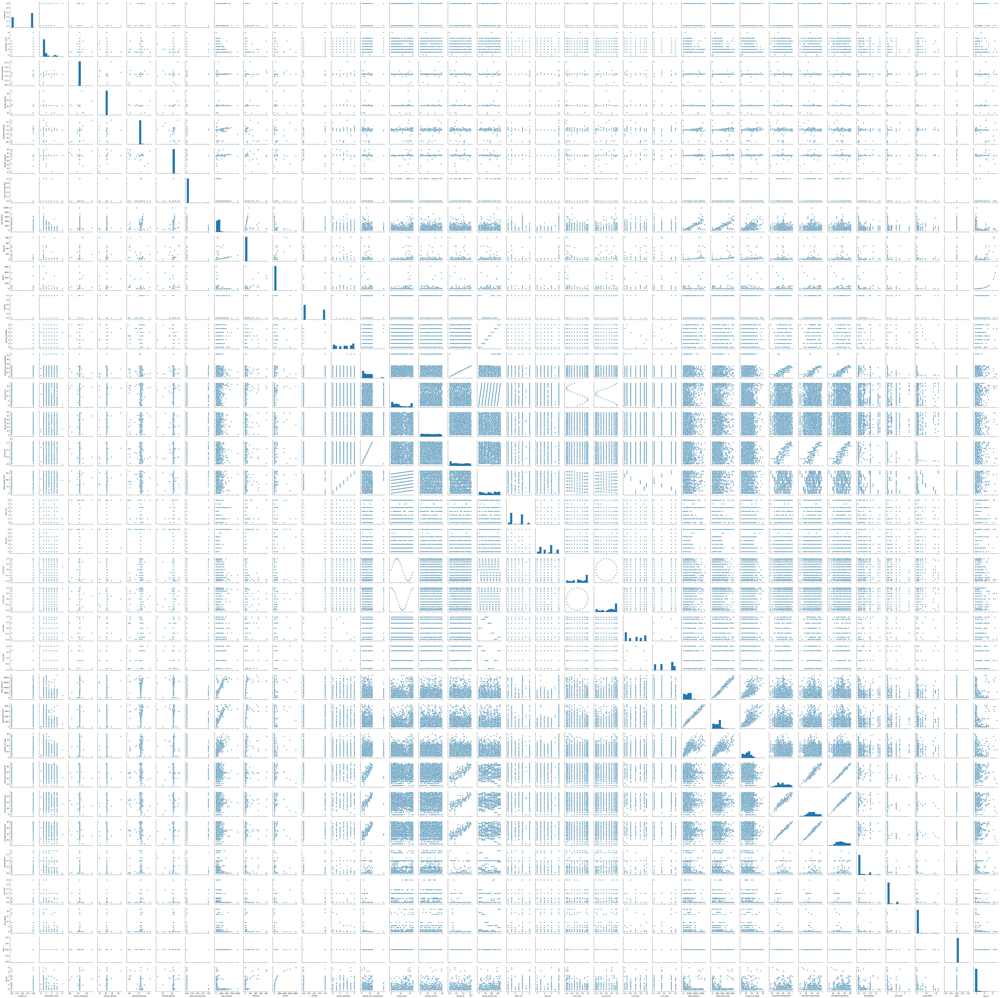

In [59]:
"""
Find out realationship when distance is less than 1 mile.
"""
sns.pairplot(df_o2)
plt.show()

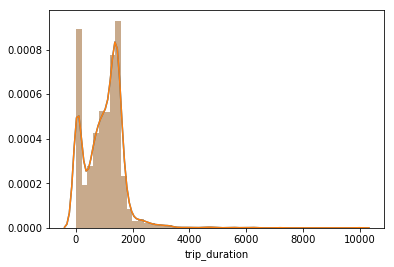

In [62]:
sns.distplot(df_o2.trip_duration)
plt.show()

In [66]:
basic_fea=['id','vendor_id','pickup_datetime_x','dropoff_datetime','passenger_count',\
 'pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude',\
 'store_and_fwd_flag','trip_duration','distance','speed','holiday',\
  'pickup_weekday','pickup_weekofyear','pickup_hour', 'pickup_minute',\
 'pickup_dt','pickup_week_hour','start_zon','end_zon','total_distance','total_travel_time',\
 'number_of_steps', 'maximum temperature','minimum temperature','average temperature',\
 'precipitation','snow fall','snow depth','log_sp']

#### Zone analysis

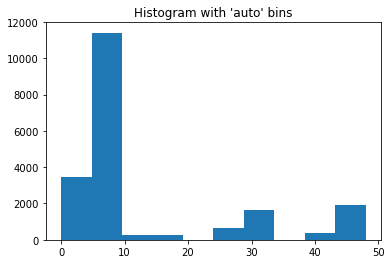

In [82]:
import matplotlib.pyplot as plt
plt.hist(df_o1.direction)  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

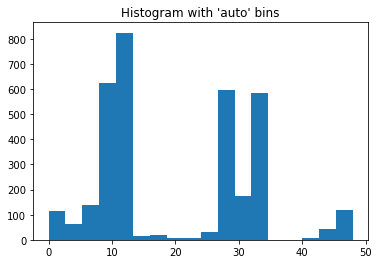

In [76]:
plt.hist(df_o2.direction, bins='auto')  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

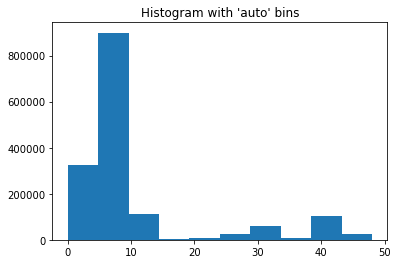

In [80]:
import matplotlib.pyplot as plt
plt.hist(df.direction)  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

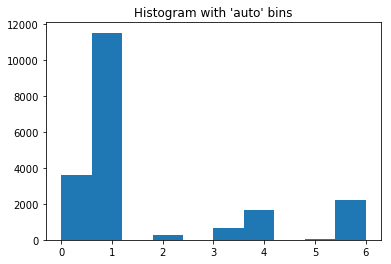

In [84]:
plt.hist(df_o1.start_zon)  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

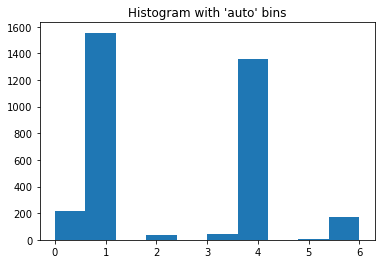

In [85]:
plt.hist(df_o2.start_zon)  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

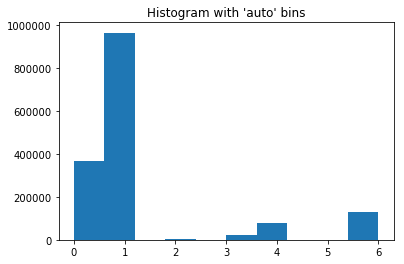

In [86]:
plt.hist(df.start_zon)  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

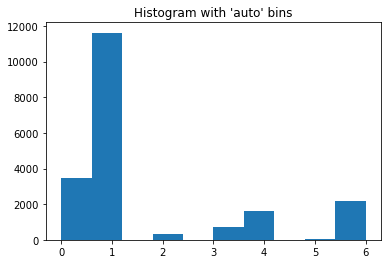

In [87]:
plt.hist(df_o1.end_zon)  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

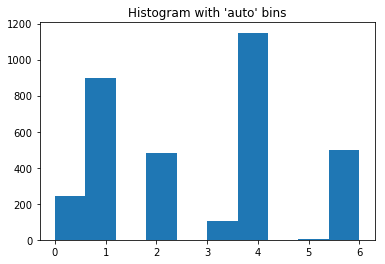

In [88]:
plt.hist(df_o2.end_zon)  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

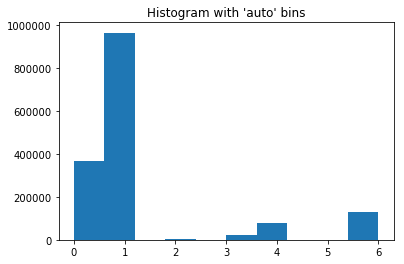

In [89]:
plt.hist(df.start_zon)  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

In [ ]:
"""
Zone and derection can tell 2.
"""

#### Date analysis

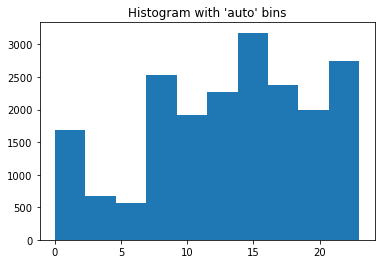

In [97]:
plt.hist(df_o1.pickup_hour)  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

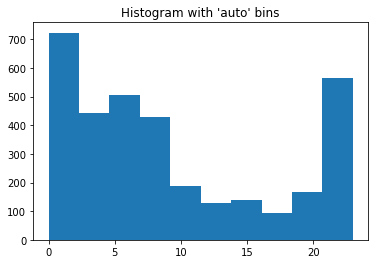

In [98]:
plt.hist(df_o2.pickup_hour)  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

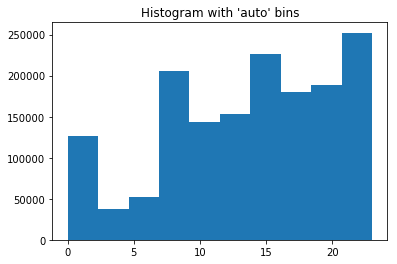

In [99]:
plt.hist(df.pickup_hour)  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

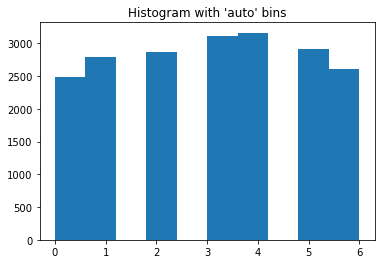

In [100]:
plt.hist(df_o1.pickup_weekday)  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

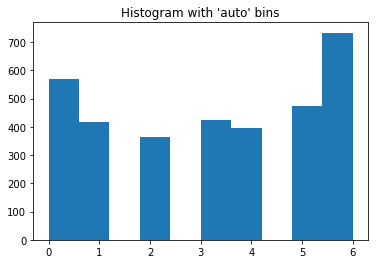

In [101]:
plt.hist(df_o2.pickup_weekday)  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

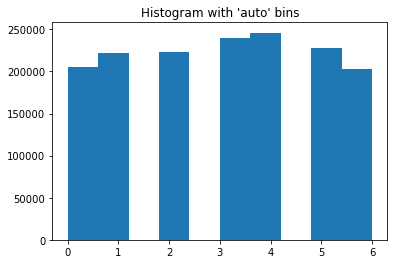

In [102]:
plt.hist(df.pickup_weekday)  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

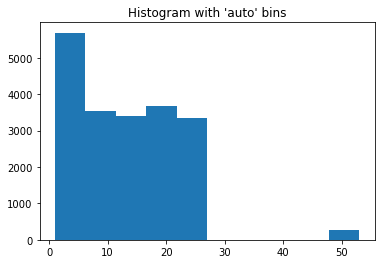

In [106]:
plt.hist(df_o1.pickup_weekofyear)  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

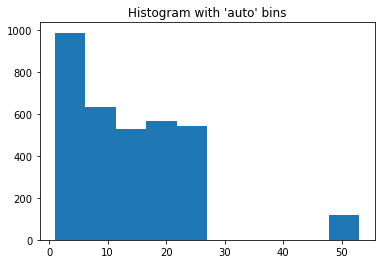

In [107]:
plt.hist(df_o2.pickup_weekofyear)  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

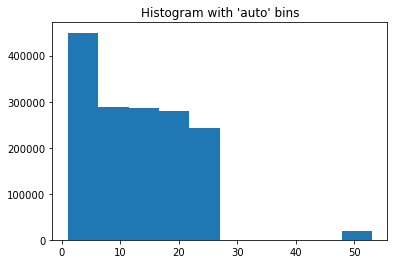

In [108]:
plt.hist(df.pickup_weekofyear)  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

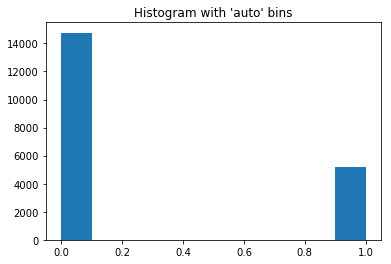

In [126]:
plt.hist(df_o1.holiday)  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

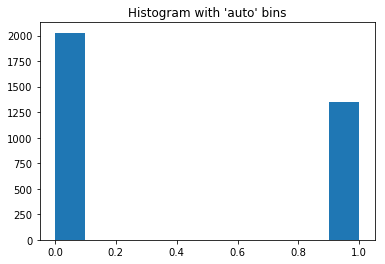

In [127]:
plt.hist(df_o2.holiday)  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

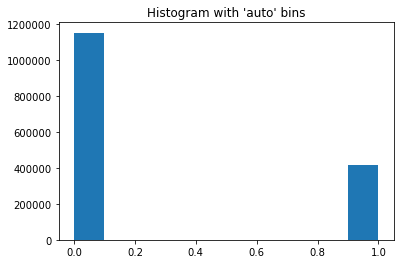

In [128]:
plt.hist(df.holiday)  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

In [ ]:
"""
pickup_weekday: 
pickup_hour:
holiday:
This fits common sense.
Can tell 2.
"""

#### Weather Analysis

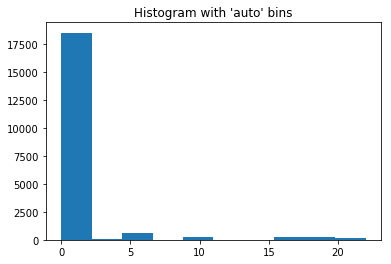

In [109]:
plt.hist(df_o1['snow depth'])  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

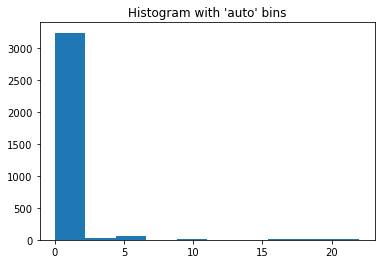

In [110]:
plt.hist(df_o2['snow depth'])  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

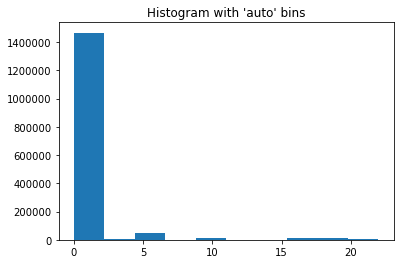

In [111]:
plt.hist(df['snow depth'])  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

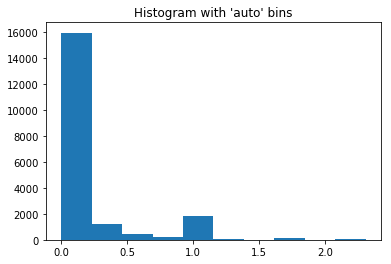

In [122]:
plt.hist(df_o1['precipitation'])  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

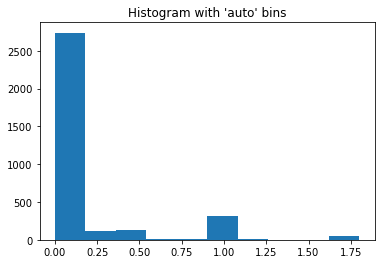

In [123]:
plt.hist(df_o2['precipitation'])  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

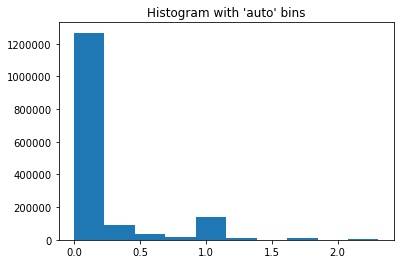

In [124]:
plt.hist(df['precipitation'])  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

#### Distance and other Analysis

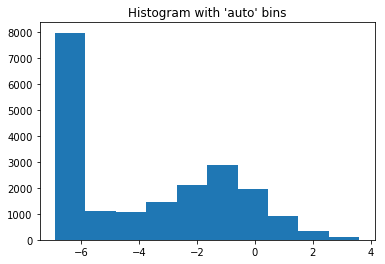

In [137]:
plt.hist(np.log(np.array(df_o1.distance.tolist())+0.001))  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

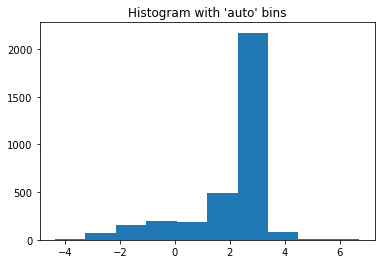

In [136]:
plt.hist(np.log(np.array(df_o2.distance.tolist())+0.001))  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

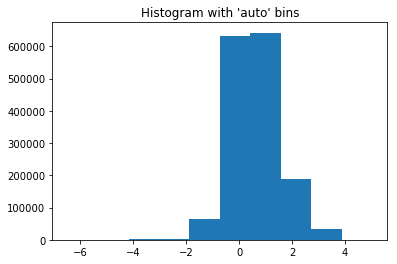

In [138]:
plt.hist(np.log(np.array(df.distance.tolist())+0.001))  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

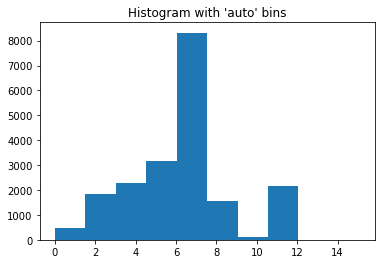

In [142]:
plt.hist(np.log(np.array(df_o1.trip_duration.tolist())+0.001))  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

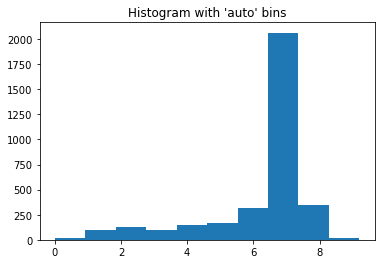

In [143]:
plt.hist(np.log(np.array(df_o2.trip_duration.tolist())+0.001))  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

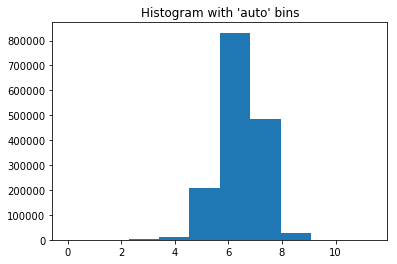

In [144]:
plt.hist(np.log(np.array(df.trip_duration.tolist())+0.001))  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

In [147]:
print(train[train.trip_duration>3600].shape)
long_trip=train[train.trip_duration>3600]

(13447, 42)


In [148]:
long_trip['number_of_steps']

376        16.0
428        16.0
570         7.0
932        18.0
933        18.0
1152       16.0
1212       19.0
1234        5.0
1262       13.0
1358       16.0
1504        3.0
1522       20.0
1757       30.0
2018       15.0
2031       14.0
2217       27.0
2226       17.0
2537       18.0
3065       20.0
3276       21.0
3372       21.0
3518       16.0
3557       16.0
3748        2.0
3883       15.0
3922       20.0
4214       12.0
4547        8.0
4706       16.0
4731        3.0
           ... 
1585818    18.0
1585923    14.0
1585996    30.0
1585997    24.0
1586143    13.0
1586200    12.0
1586348     6.0
1586407    16.0
1586461    17.0
1586787    16.0
1586788    16.0
1586885    19.0
1586999    23.0
1587031    17.0
1587241    22.0
1587432    16.0
1587888     6.0
1588065    18.0
1588215    20.0
1588378    10.0
1588610    19.0
1588707     6.0
1588822    15.0
1589202    21.0
1589301     4.0
1589533     9.0
1589650     4.0
1589841    14.0
1589929    15.0
1590216    20.0
Name: number_of_steps, L

#### Analysis Extreme case

In [5]:
train_1=train[train.trip_duration<72000]
train_2=train[train.trip_duration>=72000]
train_0=train[train.distance==0]
train_1=train_1[train_1.distance!=0]

In [11]:
train_1[['pickup_longitude','pickup_latitude']].\
                        to_csv(path+'train_1_start.csv',sep='\t', encoding='utf-8')
train_1[['dropoff_longitude','dropoff_latitude']].\
                        to_csv(path+'train_1_end.csv',sep='\t', encoding='utf-8')
train_0[['pickup_longitude','pickup_latitude']].\
                        to_csv(path+'train_0_start.csv',sep='\t', encoding='utf-8')
train_0[['dropoff_longitude','dropoff_latitude']].\
                        to_csv(path+'train_0_end.csv',sep='\t', encoding='utf-8')
train_2[['pickup_longitude','pickup_latitude']].\
                        to_csv(path+'train_2_start.csv',sep='\t', encoding='utf-8')
train_2[['dropoff_longitude','dropoff_latitude']].\
                        to_csv(path+'train_2_end.csv',sep='\t', encoding='utf-8')

In [20]:
search_result = my_gis.content.search(query="title:NY_0s")
map0= my_gis.map(search_result[0])
map0

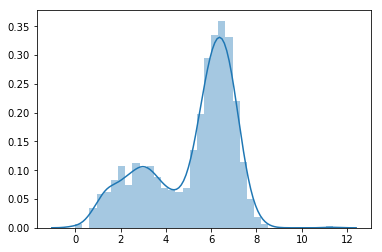

In [28]:
sns.distplot(np.log(train_0.trip_duration.tolist()))
plt.show()

In [83]:
train_2.shape

(2098, 47)

#### Analysis 2 type

In [84]:
route_service_url = my_gis.properties.helperServices.route.url
route_service = network.RouteLayer(route_service_url, gis=my_gis)

In [86]:
result=my_gis.content.search('title: ArcGIS Online Directions and Routing Services Coverage type:Web Map owner:esri',
                      item_type='Web Map', outside_org=True)[0]

In [88]:
result=my_gis.content.search('title: World Traffic Map type:Web Map owner:esri',
                      item_type='Web Map', outside_org=True)[0]

<Item title:"World Traffic Map" type:Web Map owner:esri>
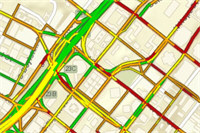

In [89]:
result

In [133]:
start=np.array([train_2['pickup_longitude'].tolist(),train_2['pickup_latitude'].tolist()]).T
end =np.array([train_2['dropoff_longitude'].tolist(),train_2['dropoff_latitude'].tolist()]).T
stops=np.array(list(map(tostops,start,end)))

In [147]:
route_layer = network.RouteLayer(route_service_url, gis=my_gis)
results=[]
def toroute(stop):
    result = route_layer.solve(stops=stop, 
                               directions_language='en-US', return_routes=True,
                               return_stops=True, return_directions=False,
                               return_barriers=False, return_polygon_barriers=False,
                               return_polyline_barriers=False)
    return result

In [150]:
results=list(map(toroute,stops))

In [151]:
output = open(path+'listofroutine.pkl', 'wb')
pickle.dump(results,output)

In [179]:
pts=np.array(results[0]['routes']['features'][0]['geometry']['paths'][0])

In [216]:
train['pickup_latitude'].quantile([.005, .995])
#train_2.pickup_latitude#

0.005    40.644386
0.995    40.815296
Name: pickup_latitude, dtype: float64

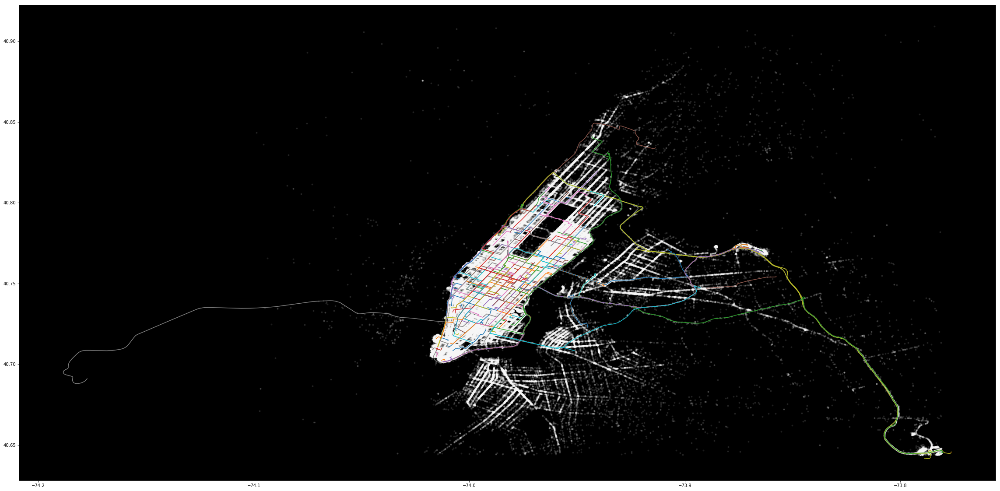

In [231]:
import matplotlib.pyplot as plt
import numpy as np



# Note that using plt.subplots below is equivalent to using
# fig = plt.figure() and then ax = fig.add_subplot(111)
fig, ax = plt.subplots(figsize=(40,20))

x1=train[((train.pickup_longitude>-74.1)&(train.pickup_longitude<-73.781)
         &(train.pickup_latitude>40.644)&(train.pickup_latitude<40.91))].pickup_longitude
y1=train[((train.pickup_longitude>-74.1)&(train.pickup_longitude<-73.781)
         &(train.pickup_latitude>40.644)&(train.pickup_latitude<40.91))].pickup_latitude

plt.plot(x1,y1 , 'w.',alpha=0.1)

try:
    for i in range(len(results)):
        pts=np.array(results[i]['routes']['features'][0]['geometry']['paths'][0])
        x=pts.T[0]
        y=pts.T[1]
        ax.plot(x, y)
except:
    pass

ax.grid(False)
ax.set_facecolor((0, 0, 0))

fig.savefig("test.png")
plt.show()

In [ ]:
"""
This plot show the extreme long duration is 
someone get a cad and tour or do business in
New York for several hours. 
"""

#### Analysis Type0

In [21]:
train_0=train[train.distance==0]
test_0=test[test.distance==0]

In [5]:
fea=['passenger_count','holiday','pickup_weekday','pickup_weekofyear','pickup_hour','pickup_dt',\
 'pickup_week_hour','start_zon','end_zon','maximum temperature','minimum temperature','average temperature',\
 'precipitation','snow fall','snow depth','pickup_pca0','pickup_pca1','trip_duration']

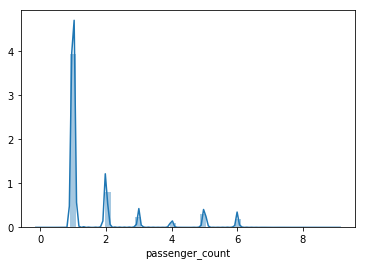

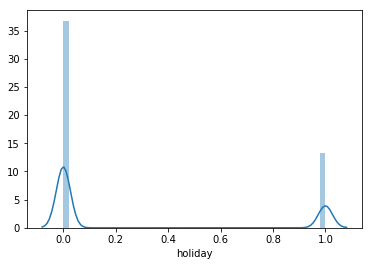

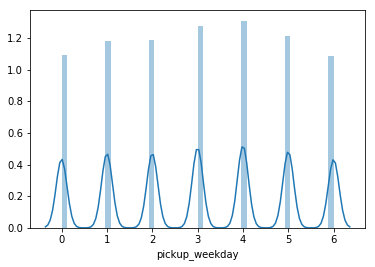

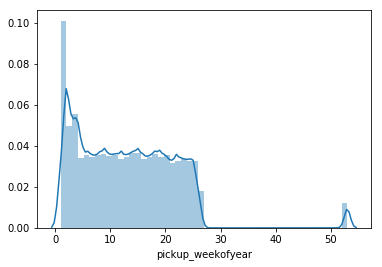

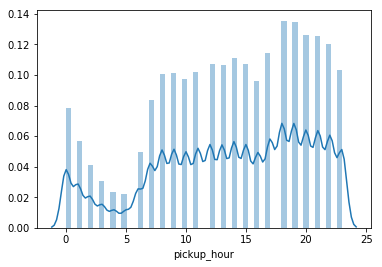

...

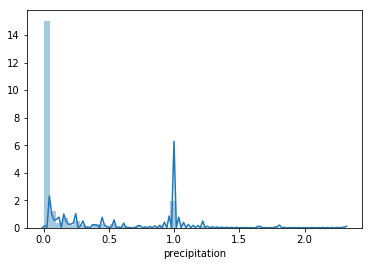

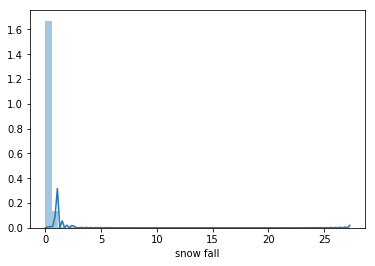

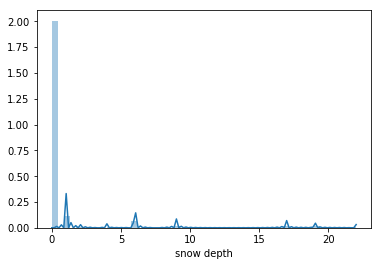

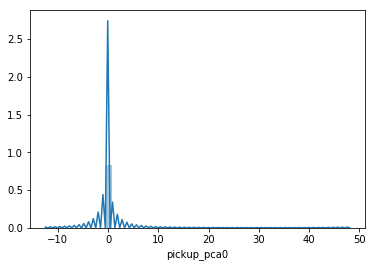

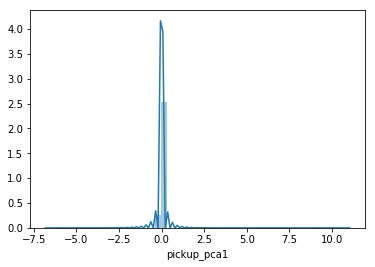

In [481]:
for f in fea:
    sns.distplot(train[f])
    plt.show()  
 

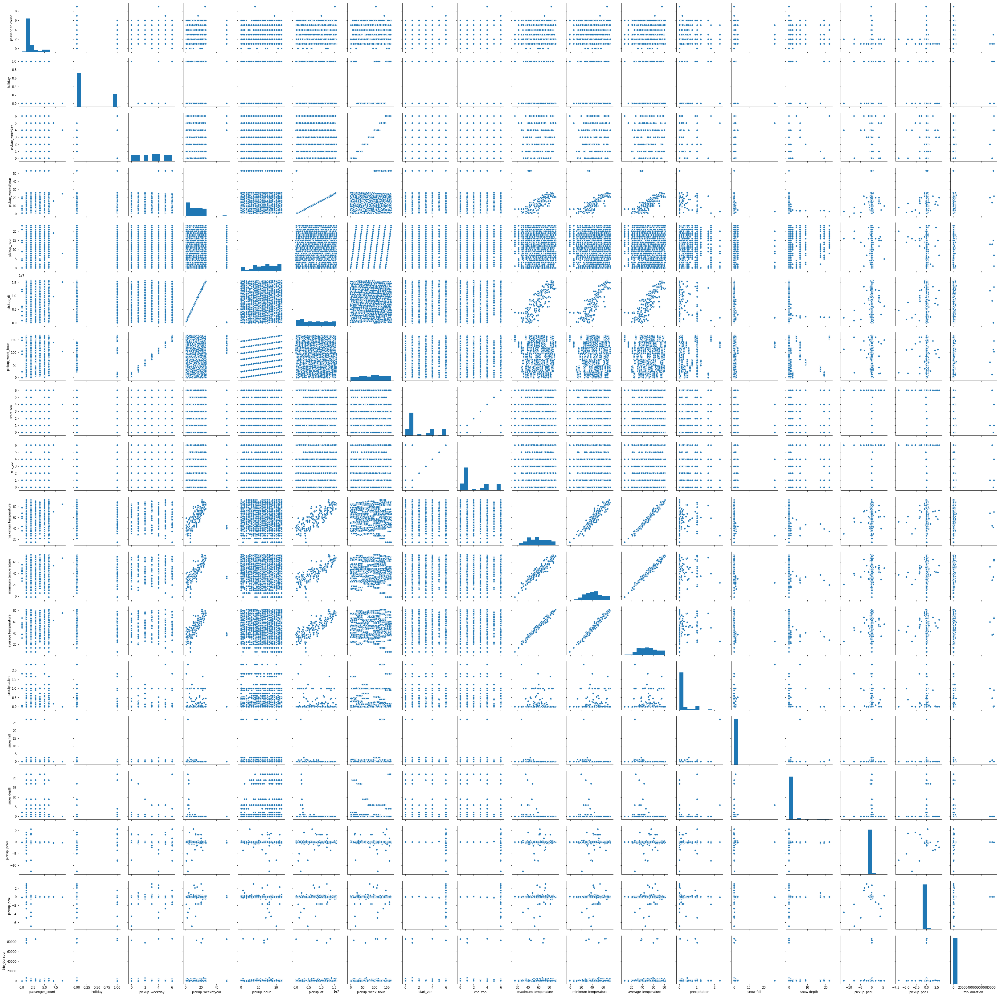

In [485]:
sns.pairplot(train_0[fea])
plt.show()

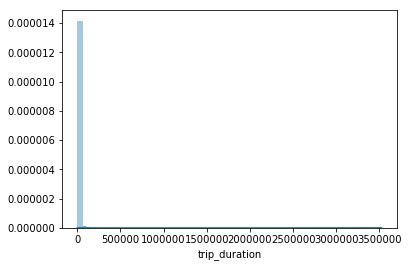

In [486]:
sns.distplot(train['trip_duration'])
plt.show()

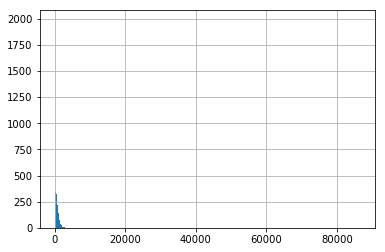

In [500]:
plt.hist(train_0.trip_duration,bins='auto')
plt.grid(True)
plt.show()

In [502]:
train_0['trip_duration'].describe()

count     6596.000000
mean       554.364008
std       2361.819210
min          1.000000
25%         37.000000
50%        349.000000
75%        721.250000
max      86352.000000
Name: trip_duration, dtype: float64

In [506]:
train_0[train_0.trip_duration<37].shape

(1646, 47)

In [513]:
tempdf=train_0[train_0.trip_duration>721.5]
tempdf[['pickup_longitude','pickup_latitude']].to_csv(path+'ge721.csv',sep='\t', encoding='utf-8')


In [507]:
train_0[((train_0.trip_duration>=37)&(train_0.trip_duration<=721.5))].shape

(3301, 47)

In [508]:
train_0[train_0.trip_duration>721.5].shape

(1649, 47)

<Item title:"000" type:Web Map owner:Jason_yan>
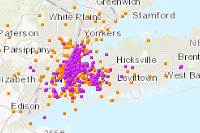

In [515]:
result=my_gis.content.search(query='title:000')[0]
result

In [516]:
"""
These pts are geographically unifrom distributed.
"""

'\n'

In [8]:
fr1 = pd.read_csv(path+'fastest_routes_train_part_1.csv')
fr2 = pd.read_csv(path+'fastest_routes_train_part_2.csv')
test_street_info = pd.read_csv(path+'fastest_routes_test.csv')

train_street_info = pd.concat((fr1, fr2))


In [ ]:
test_street_info_2 = pd.read_csv(path+'second_fastest_routes_test.csv')
train_street_info_2= pd.read_csv(path+'second_fastest_routes_train.csv')

In [23]:
train_0 = train_0.merge(train_street_info, how='left', on='id')
test_0 =test_0 .merge(test_street_info, how='left', on='id')

In [26]:
train_0.to_csv(path+'t0.csv')

In [34]:
"""
No more information , they are pure random wait.
"""

SyntaxError: EOF while scanning triple-quoted string literal (<ipython-input-34-ab0d5f5f0780>, line 1)

## Final report

In [ ]:
"""
After so many analysis, I found three different type of behavior in all trips.
And try to classify all these out.

1. Wait: distance =0, use K-NN
2. Rent trip: label train data and use randomforest to classify, Xgboost to estimate time
3. Normal trip: Xgboost to estimate time

"""

### Data prepare

In [27]:
train_0=train[train.distance==0]
train_0.index=range(train_0.shape[0])
train_1=train[train.distance!=0]
train_1['Type']=0

train_1['Type'].iloc[train_1[train_1.trip_duration<=18000].index]=0
train_1['Type'].iloc[train_1[train_1.trip_duration>18000].index]=1
train_1=train_1[train_1.speed<100]
train_1.index=range(train_1.shape[0])

/Users/yanxinzhou/.pyenv/versions/anaconda3-4.2.0/lib/python3.5/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/yanxinzhou/.pyenv/versions/anaconda3-4.2.0/lib/python3.5/site-packages/pandas/core/indexing.py:194: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)
/Users/yanxinzhou/.pyenv/versions/anaconda3-4.2.0/lib/python3.5/site-packages/ipykernel/__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pa

In [40]:
id0=test[test.distance==0].index
id1=test[(test.distance!=0)&(test.Type!=1)].index
id2=test[(test.distance!=0)&(test.Type==1)].index


### Feature check

In [29]:
fea_xgb=['passenger_count','pickup_longitude','pickup_latitude','dropoff_longitude',\
 'dropoff_latitude','store_and_fwd_flag', 'distance', 'holiday','pickup_weekday',\
 'pickup_weekofyear','pickup_hour','pickup_minute', 'pickup_dt', 'pickup_week_hour',\
 'start_zon','end_zon','total_distance','total_travel_time','number_of_steps',\
 'average temperature','snow fall','snow depth','direction', 'pickup_pca0',\
 'pickup_pca1','dropoff_pca0', 'dropoff_pca1']
fea_rf=['passenger_count','pickup_longitude','pickup_latitude','dropoff_longitude',\
 'dropoff_latitude','store_and_fwd_flag', 'distance', 'holiday','pickup_weekday',\
 'pickup_weekofyear','pickup_hour','pickup_minute', 'pickup_dt', 'pickup_week_hour',\
 'start_zon','end_zon','total_distance','total_travel_time','number_of_steps',\
 'average temperature','snow fall','snow depth','direction', 'pickup_pca0',\
 'pickup_pca1','dropoff_pca0', 'dropoff_pca1']
fea_xgb0=['vendor_id','passenger_count', 'pickup_longitude', 'pickup_latitude',\
 'dropoff_longitude','dropoff_latitude', 'store_and_fwd_flag','distance',\
 'holiday','pickup_weekday', 'pickup_weekofyear','pickup_hour','pickup_minute',\
'pickup_dt','pickup_week_hour','start_zon','end_zon','t_sin_hour',\
 't_cos_hour','t_sin_day','t_cos_day', 'total_distance', 'total_travel_time',\
 'number_of_steps','maximum temperature','minimum temperature','average temperature',\
 'snow fall','snow depth','direction','pickup_pca0','pickup_pca1', 'dropoff_pca0',\
 'dropoff_pca1']

### Random forest to find Type

In [30]:
from sklearn.ensemble import RandomForestClassifier
rf_clf = RandomForestClassifier(criterion='entropy',max_depth=25,
                                 min_samples_split=10,random_state=123,
                                n_jobs=3,class_weight='balanced')

In [31]:
### Type RF
sh=[x for x in range(train_1.shape[0])]
np.random.shuffle(sh)
rf_tr=train_1.iloc[sh][:int(train_1.shape[0]*0.8)]
rf_vd=train_1.iloc[sh][int(train_1.shape[0]*0.8):]

In [33]:
rf_clf.fit(rf_tr[fea_xgb0], rf_tr['Type'])

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='entropy', max_depth=25, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=10, min_weight_fraction_leaf=0.0,
            n_estimators=10, n_jobs=3, oob_score=False, random_state=123,
            verbose=0, warm_start=False)

In [35]:
pred=rf_clf.predict(rf_vd[fea_xgb0])
print(classification_report(rf_vd['Type'], pred, target_names=['0','1'])) 

             precision    recall  f1-score   support

          0       1.00      1.00      1.00    316272
          1       0.21      0.11      0.15       432

avg / total       1.00      1.00      1.00    316704



In [36]:
test['Type']=rf_clf.predict(test[fea_xgb0])

In [37]:
from operator import itemgetter, attrgetter, methodcaller
fea_score=list(zip(fea_rf,rf_clf.feature_importances_))
sorted(fea_score, key=itemgetter(1), reverse=True)

[('passenger_count', 0.27039460746132293),
 ('holiday', 0.038612372190556125),
 ('snow depth', 0.03771611054473115),
 ('pickup_latitude', 0.03614310824785223),
 ('pickup_dt', 0.0360689621527596),
 ('pickup_week_hour', 0.03575066955140695),
 ('direction', 0.03565235240423692),
 ('dropoff_latitude', 0.03528395170509106),
 ('store_and_fwd_flag', 0.034044179972929065),
 ('dropoff_longitude', 0.03299880362824982),
 ('start_zon', 0.030970467765005817),
 ('dropoff_pca1', 0.023309964693831703),
 ('dropoff_pca0', 0.02265525691987403),
 ('pickup_pca0', 0.021912241934277443),
 ('pickup_minute', 0.021836083640755847),
 ('pickup_pca1', 0.021476617468021146),
 ('total_travel_time', 0.020899684534390558),
 ('pickup_hour', 0.01981683855444058),
 ('number_of_steps', 0.018982926425363568),
 ('pickup_longitude', 0.015447792652007622),
 ('average temperature', 0.009692276710049547),
 ('pickup_weekofyear', 0.007728672119671566),
 ('snow fall', 0.005885975745493362),
 ('total_distance', 0.005150050244750979

### Train XGB on Type1

In [41]:
from sklearn.model_selection import train_test_split
y=np.log(train_1['trip_duration'].iloc[train_1[train_1.Type!=1].index].tolist())
Xtr, Xv, ytr, yv = train_test_split(train_1[fea_xgb].iloc[train_1[train_1.Type!=1].index]\
                                    .values, y, test_size=0.2, random_state=2000)

In [42]:
import xgboost as xgb
dtrain = xgb.DMatrix(Xtr, label=ytr)
dvalid = xgb.DMatrix(Xv, label=yv)
dtest = xgb.DMatrix(test[fea_xgb].iloc[id1].values)
watchlist = [(dtrain, 'train'), (dvalid, 'valid')]

In [43]:
xgb_pars = {'min_child_weight': 50, 'eta': 0.3, 'colsample_bytree': 0.3, 'max_depth': 10,
            'subsample': 0.8, 'lambda': 1, 'nthread': 4, 'booster' : 'gbtree', 'silent': 1,
            'eval_metric': 'rmse', 'objective': 'reg:linear'}
model = xgb.train(xgb_pars, dtrain, 60, watchlist, early_stopping_rounds=50,
                  maximize=False, verbose_eval=10)

[0]	train-rmse:4.22623	valid-rmse:4.22715
Multiple eval metrics have been passed: 'valid-rmse' will be used for early stopping.

Will train until valid-rmse hasn't improved in 50 rounds.
[10]	train-rmse:0.390125	valid-rmse:0.395536
[20]	train-rmse:0.340801	valid-rmse:0.350968
[30]	train-rmse:0.32752	valid-rmse:0.340902
[40]	train-rmse:0.317145	valid-rmse:0.333857
[50]	train-rmse:0.312011	valid-rmse:0.331293
[59]	train-rmse:0.308279	valid-rmse:0.32968


In [44]:
occupy=np.zeros(test.shape[0])
xgb_2=pd.DataFrame({'trip_duration':occupy},columns=['trip_duration'],index=test.id)
ytest = model.predict(dtest)
xgb_2['trip_duration'].iloc[id1]=np.exp(ytest)
#xgb_2.to_csv(path+'xgb_18.csv')

### Train on Type2

In [45]:
y=np.log(train_1['trip_duration'].iloc[train_1[train_1.Type==1].index].tolist())
Xtr, Xv, ytr, yv = train_test_split(train_1[fea_xgb].iloc[train_1[train_1.Type==1].index]\
                                    .values, y, test_size=0.2, random_state=2000)

In [46]:
dtrain = xgb.DMatrix(Xtr, label=ytr)
dvalid = xgb.DMatrix(Xv, label=yv)
dtest = xgb.DMatrix(test[fea_xgb].iloc[id2].values)
watchlist = [(dtrain, 'train'), (dvalid, 'valid')]

In [47]:
xgb_pars = {'min_child_weight': 120, 'eta': 0.3, 'colsample_bytree': 0.3, 'max_depth': 5,
            'subsample': 0.8, 'lambda': 2, 'nthread': 4, 'booster' : 'gbtree', 'silent': 1,
            'eval_metric': 'rmse', 'objective': 'reg:linear'}
model1 = xgb.train(xgb_pars, dtrain, 60, watchlist, early_stopping_rounds=50,
                  maximize=False, verbose_eval=10)

[0]	train-rmse:7.57228	valid-rmse:7.5767
Multiple eval metrics have been passed: 'valid-rmse' will be used for early stopping.

Will train until valid-rmse hasn't improved in 50 rounds.
[10]	train-rmse:0.322949	valid-rmse:0.384891
[20]	train-rmse:0.226018	valid-rmse:0.30973
[30]	train-rmse:0.219669	valid-rmse:0.308645
[40]	train-rmse:0.213956	valid-rmse:0.309605
[50]	train-rmse:0.210105	valid-rmse:0.310224
[59]	train-rmse:0.206138	valid-rmse:0.310892


In [48]:
ytest = model1.predict(dtest)
xgb_2['trip_duration'].iloc[id2]=np.exp(ytest)
#xgb_2.to_csv(path+'xgb_18.csv')

In [49]:
xgb_2['trip_duration'].iloc[id2].shape

(351,)

### XGB on Type 0

In [455]:
y=np.log(train_0['trip_duration'].tolist())
Xtr, Xv, ytr, yv = train_test_split(train_0[fea_xgb0]\
                                    .values, y, test_size=0.2, random_state=2000)

In [456]:
dtrain = xgb.DMatrix(Xtr, label=ytr)
dvalid = xgb.DMatrix(Xv, label=yv)
dtest = xgb.DMatrix(test[fea_xgb0].iloc[id0].values)
watchlist = [(dtrain, 'train'), (dvalid, 'valid')]

In [468]:
xgb_pars = {'min_child_weight': 100, 'eta': 0.3, 'colsample_bytree': 0.3, 'max_depth': 8,
            'subsample': 0.8, 'lambda': 1.5, 'nthread': 4, 'booster' : 'gbtree', 'silent': 1,
            'eval_metric': 'rmse', 'objective': 'reg:linear'}
model1 = xgb.train(xgb_pars, dtrain, 60, watchlist, early_stopping_rounds=50,
                  maximize=False, verbose_eval=10)

[0]	train-rmse:3.74443	valid-rmse:3.75073
Multiple eval metrics have been passed: 'valid-rmse' will be used for early stopping.

Will train until valid-rmse hasn't improved in 50 rounds.
[10]	train-rmse:1.4952	valid-rmse:1.63227
[20]	train-rmse:1.41717	valid-rmse:1.60209
[30]	train-rmse:1.36537	valid-rmse:1.60044
[40]	train-rmse:1.32795	valid-rmse:1.59796
[50]	train-rmse:1.28626	valid-rmse:1.60616
[59]	train-rmse:1.25701	valid-rmse:1.59941


In [51]:
#ytest = model1.predict(dtest)
xgb_2['trip_duration'].iloc[id0]=350#np.exp(ytest)
xgb_2.to_csv(path+'xgb_35.csv')

### KNN on Type0

In [ ]:
"""
These points are around airport, school, sightscence....
So basically, the behavior of distance 0 is to wait.
To classifiy the duration of wait,we can use knn as data is pleanty.
"""

In [353]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
y=np.log(train_0['trip_duration'].tolist())
Xtr, Xv, ytr, yv = train_test_split(train_0[fea], y, test_size=0.2,random_state=1)

In [354]:
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=1)
neigh.fit(train_0[fea_knn]) 
pred=neigh.kneighbors(test[fea_knn].iloc[id0], return_distance=False) 

In [345]:
def rmsle(y_true,y_pred):
    assert len(y_true) == len(y_pred)
    return np.square(np.log(y_pred + 1) - np.log(y_true + 1)).mean() ** 0.5
rmsle(yv, ytr[pred])

0.5525145399297415

In [380]:
yf=np.array(train_0['trip_duration'].tolist())
yf[pred].shape
xgb_2['trip_duration'].iloc[id0].shape
yf[pred].reshape((-1,))

array([ 553,   44, 1239, ...,  181, 1034,  446])

In [383]:
xgb_2['trip_duration'].iloc[id0]=yf[pred].reshape((-1,))
xgb_2.to_csv(path+'xgb_30.csv')